In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, cross_validate, learning_curve, StratifiedKFold
from sklearn.feature_selection import RFECV, RFE
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc, precision_recall_curve, average_precision_score, ConfusionMatrixDisplay
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance
from sklearn.base import clone
from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE

In [2]:
# Se cargan los datos como dataframes
tcga_mirna_df = pd.read_csv('/Users/alejandra/UNIR/TFM/TCGA_miARN.tsv', sep = '\t')
bic_df = pd.read_csv('/Users/alejandra/UNIR/TFM/BIC_BRCA.csv', sep = ';', usecols = ['Patient_barcode', 'Sample_barcode', 'Aliquot_barcode_miRNAseq',
                                                                                     'Sample_type', 'Stage'],
                                                                          dtype = {'Patient_barcode': str, 'Sample_barcode': str, 'Aliquot_barcode_miRNAseq': str,
                                                                                   'Sample_type': str, 'Stage': str})
bacteria_composition_df = pd.read_csv('/Users/alejandra/UNIR/TFM/bacteria_composition_modified.csv', sep = ';')

In [3]:
# Se muestran las primeras líneas del dataframe de BIC
bic_df.head()

,Patient_barcode,Sample_barcode,Aliquot_barcode_miRNAseq,Sample_type,Stage
0,TCGA-AO-A12G,TCGA-AO-A12G-01A,TCGA-AO-A12G-01A-11R-A10I-13,Primary Tumor,II
1,TCGA-C8-A26V,TCGA-C8-A26V-01A,TCGA-C8-A26V-01A-11R-A16E-13,Primary Tumor,III
2,TCGA-C8-A1HO,TCGA-C8-A1HO-01A,TCGA-C8-A1HO-01A-11R-A13P-13,Primary Tumor,III
3,TCGA-AC-A2BK,TCGA-AC-A2BK-01A,TCGA-AC-A2BK-01A-11R-A21U-13,Primary Tumor,III
4,TCGA-EW-A1J3,TCGA-EW-A1J3-01A,TCGA-EW-A1J3-01A-11R-A13P-13,Primary Tumor,I


In [4]:
bic_df.shape
# El dataframe de BIC está formado por 1155 registros y 5 columnas. Tras análisis realizado previamente, se han eliminado del dataset original 23 muestras de tipo tumor sin estadío.

(1155, 5)

In [5]:
bic_df.columns
# Las columnas de BIC son las siguiente:

Index(['Patient_barcode', 'Sample_barcode', 'Aliquot_barcode_miRNAseq',
       'Sample_type', 'Stage'],
      dtype='object')

In [6]:
bacteria_composition_df.head(5)

,Aliquot barcode mirna seq,Bacteria,Relative abundance
0,TCGA-BH-A0RX-01A,Actinomycetales,0.160804
1,TCGA-A8-A07R-01A,Actinomycetales,0.329167
2,TCGA-AC-A6IV-01A,Actinomycetales,0.137374
3,TCGA-AO-A0JI-01A,Actinomycetales,0.247059
4,TCGA-A2-A3XX-01A,Actinomycetales,0.136170


In [7]:
bacteria_composition_df.columns

Index(['Aliquot barcode mirna seq', 'Bacteria', 'Relative abundance'], dtype='object')

In [8]:
bacteria_composition_df.shape

(18864, 3)

In [9]:
# Se muestran las primeras líneas del dataframe de TCGA-miARN
tcga_mirna_df.head()

,miRNA_ID,TCGA-E9-A1NI-01A,TCGA-A1-A0SP-01A,TCGA-LL-A5YP-01A,TCGA-E2-A14T-01A,TCGA-AR-A24O-01A,TCGA-A8-A09K-01A,TCGA-OL-A5RY-01A,TCGA-E9-A24A-01A,TCGA-E9-A1RB-01A,...,TCGA-E2-A1L6-01A,TCGA-BH-A0DT-11A,TCGA-A2-A0SV-01A,TCGA-BH-A0BO-01A,TCGA-B6-A0RN-01A,TCGA-EW-A1P3-01A,TCGA-A7-A13F-11A,TCGA-A2-A0T6-01A,TCGA-A7-A5ZW-01A,TCGA-BH-A203-01A
0,hsa-let-7a-1,12.686183,12.891305,12.887718,14.108360,13.461873,12.265034,12.998680,13.383760,12.845777,...,12.978411,14.018583,12.404741,13.441146,13.168463,12.648896,14.119837,12.751446,13.497555,13.377192
1,hsa-let-7a-2,12.662222,12.869347,12.879000,14.118814,13.476615,12.241975,13.005067,13.380326,12.844904,...,12.960026,14.003807,12.380744,13.449313,13.154539,12.662858,14.135787,12.752993,13.505774,13.359864
2,hsa-let-7a-3,12.702090,12.888348,12.900761,14.155944,13.488667,12.290275,12.997857,13.388873,12.853264,...,12.967357,14.035824,12.439656,13.443056,13.196045,12.676500,14.147772,12.762161,13.497234,13.375518
3,hsa-let-7b,13.954108,15.019690,13.485065,13.811893,15.261777,13.809151,13.627295,14.974551,14.759085,...,14.674505,14.873317,14.013927,15.261052,16.636407,14.392788,14.788002,14.928173,14.451789,14.947434
4,hsa-let-7c,10.343736,10.822866,10.325324,11.047247,12.039291,9.057759,11.581334,10.195591,9.996306,...,11.401806,13.281604,9.512755,12.257532,11.504708,10.826527,13.046762,11.080933,12.224227,10.234638


In [10]:
tcga_mirna_df.shape
# El dataframe de TCGA-miARN está formado por 1881 registros que son miARN y 1203 columnas que corresponden a las distintas muestras

(1881, 1203)

In [11]:
tcga_mirna_df.columns

Index(['miRNA_ID', 'TCGA-E9-A1NI-01A', 'TCGA-A1-A0SP-01A', 'TCGA-LL-A5YP-01A',
       'TCGA-E2-A14T-01A', 'TCGA-AR-A24O-01A', 'TCGA-A8-A09K-01A',
       'TCGA-OL-A5RY-01A', 'TCGA-E9-A24A-01A', 'TCGA-E9-A1RB-01A',
       ...
       'TCGA-E2-A1L6-01A', 'TCGA-BH-A0DT-11A', 'TCGA-A2-A0SV-01A',
       'TCGA-BH-A0BO-01A', 'TCGA-B6-A0RN-01A', 'TCGA-EW-A1P3-01A',
       'TCGA-A7-A13F-11A', 'TCGA-A2-A0T6-01A', 'TCGA-A7-A5ZW-01A',
       'TCGA-BH-A203-01A'],
      dtype='object', length=1203)

In [12]:
tcga_mirna_df.index

RangeIndex(start=0, stop=1881, step=1)

In [13]:
tcga_mirna_df.values

array([['hsa-let-7a-1', 12.686183205524122, 12.891304537471104, ...,
        12.751446116729715, 13.497555424836165, 13.377191799231143],
       ['hsa-let-7a-2', 12.66222205269655, 12.86934694796306, ...,
        12.752992686924513, 13.505774462710791, 13.359864419363218],
       ['hsa-let-7a-3', 12.702089701602247, 12.888348479311876, ...,
        12.762160657322973, 13.497234253006155, 13.375518275565993],
       ...,
       ['hsa-mir-98', 5.943470706930878, 6.053592386355601, ...,
        5.2749881939755765, 5.420709392793053, 5.022091765766222],
       ['hsa-mir-99a', 8.977608268141633, 9.241626816009417, ...,
        9.17833015921788, 9.467838544856145, 9.313760652109398],
       ['hsa-mir-99b', 16.20495756401816, 14.9832036208172, ...,
        14.40511658906668, 13.415149401369648, 14.530333357770752]],
      dtype=object)

Debido a que en el dataframe de TCGA-miARN las muestras se encuentran como columnas, es necesario trasponerlo para tener todas las muestras en filas y todas las características de dichas muestras como columnas. Antes de realizar la traspuesta, se procede a renombrar la columna 'miRNA_ID' del dataset de TCGA-miARN como 'Sample_barcode' para después realizar el cruce y poder mergear los 3 datasets a partir de esa columna:

In [15]:
# Se renombra la columna 'miRNA_ID' del dataset de TCGA-miARN
tcga_mirna_df.rename(columns = {'miRNA_ID': 'Sample_barcode'}, inplace = True)
# Se renombra la columna 'Aliquot barcode mirna seq' del dataset de bacteria composition para que los 3 datasets tengan una misma columna para realizar el cruce
bacteria_composition_df.rename(columns = {'Aliquot barcode mirna seq': 'Sample_barcode'}, inplace = True)

In [16]:
tcga_mirna_df.head(5)

,Sample_barcode,TCGA-E9-A1NI-01A,TCGA-A1-A0SP-01A,TCGA-LL-A5YP-01A,TCGA-E2-A14T-01A,TCGA-AR-A24O-01A,TCGA-A8-A09K-01A,TCGA-OL-A5RY-01A,TCGA-E9-A24A-01A,TCGA-E9-A1RB-01A,...,TCGA-E2-A1L6-01A,TCGA-BH-A0DT-11A,TCGA-A2-A0SV-01A,TCGA-BH-A0BO-01A,TCGA-B6-A0RN-01A,TCGA-EW-A1P3-01A,TCGA-A7-A13F-11A,TCGA-A2-A0T6-01A,TCGA-A7-A5ZW-01A,TCGA-BH-A203-01A
0,hsa-let-7a-1,12.686183,12.891305,12.887718,14.108360,13.461873,12.265034,12.998680,13.383760,12.845777,...,12.978411,14.018583,12.404741,13.441146,13.168463,12.648896,14.119837,12.751446,13.497555,13.377192
1,hsa-let-7a-2,12.662222,12.869347,12.879000,14.118814,13.476615,12.241975,13.005067,13.380326,12.844904,...,12.960026,14.003807,12.380744,13.449313,13.154539,12.662858,14.135787,12.752993,13.505774,13.359864
2,hsa-let-7a-3,12.702090,12.888348,12.900761,14.155944,13.488667,12.290275,12.997857,13.388873,12.853264,...,12.967357,14.035824,12.439656,13.443056,13.196045,12.676500,14.147772,12.762161,13.497234,13.375518
3,hsa-let-7b,13.954108,15.019690,13.485065,13.811893,15.261777,13.809151,13.627295,14.974551,14.759085,...,14.674505,14.873317,14.013927,15.261052,16.636407,14.392788,14.788002,14.928173,14.451789,14.947434
4,hsa-let-7c,10.343736,10.822866,10.325324,11.047247,12.039291,9.057759,11.581334,10.195591,9.996306,...,11.401806,13.281604,9.512755,12.257532,11.504708,10.826527,13.046762,11.080933,12.224227,10.234638


In [17]:
# Se transpone el dataframe de TCGA-miARN dataframes
tcga_mirna_df_transpose = tcga_mirna_df.transpose()

# Se restaura el índice
tcga_mirna_df_transpose.reset_index(inplace = True)

In [18]:
tcga_mirna_df_transpose.columns

Index(['index',       0,       1,       2,       3,       4,       5,       6,
             7,       8,
       ...
          1871,    1872,    1873,    1874,    1875,    1876,    1877,    1878,
          1879,    1880],
      dtype='object', length=1882)

In [19]:
tcga_mirna_df_transpose.index

RangeIndex(start=0, stop=1203, step=1)

In [20]:
tcga_mirna_df_transpose.values

array([['Sample_barcode', 'hsa-let-7a-1', 'hsa-let-7a-2', ...,
        'hsa-mir-98', 'hsa-mir-99a', 'hsa-mir-99b'],
       ['TCGA-E9-A1NI-01A', 12.686183205524122, 12.66222205269655, ...,
        5.943470706930878, 8.977608268141633, 16.20495756401816],
       ['TCGA-A1-A0SP-01A', 12.891304537471104, 12.86934694796306, ...,
        6.053592386355601, 9.241626816009417, 14.9832036208172],
       ...,
       ['TCGA-A2-A0T6-01A', 12.751446116729715, 12.752992686924513, ...,
        5.2749881939755765, 9.17833015921788, 14.40511658906668],
       ['TCGA-A7-A5ZW-01A', 13.497555424836165, 13.505774462710791, ...,
        5.420709392793053, 9.467838544856145, 13.415149401369648],
       ['TCGA-BH-A203-01A', 13.377191799231143, 13.359864419363218, ...,
        5.022091765766222, 9.313760652109398, 14.530333357770752]],
      dtype=object)

In [21]:
tcga_mirna_df_transpose.head(5)

,index,0,1,2,3,4,5,6,7,8,...,1871,1872,1873,1874,1875,1876,1877,1878,1879,1880
0,Sample_barcode,hsa-let-7a-1,hsa-let-7a-2,hsa-let-7a-3,hsa-let-7b,hsa-let-7c,hsa-let-7d,hsa-let-7e,hsa-let-7f-1,hsa-let-7f-2,...,hsa-mir-941-5,hsa-mir-942,hsa-mir-943,hsa-mir-944,hsa-mir-95,hsa-mir-9500,hsa-mir-96,hsa-mir-98,hsa-mir-99a,hsa-mir-99b
1,TCGA-E9-A1NI-01A,12.686183,12.662222,12.70209,13.954108,10.343736,9.295373,9.635422,10.590267,10.619278,...,0.0,0.0,0.0,0.0,1.626492,0.0,5.48671,5.943471,8.977608,16.204958
2,TCGA-A1-A0SP-01A,12.891305,12.869347,12.888348,15.01969,10.822866,9.947921,9.849888,10.752409,10.725704,...,0.0,3.338596,0.0,0.0,4.381362,0.0,5.365221,6.053592,9.241627,14.983204
3,TCGA-LL-A5YP-01A,12.887718,12.879,12.900761,13.485065,10.325324,9.747751,11.101686,11.889678,11.923924,...,0.0,2.71822,0.0,0.225409,1.428192,0.0,4.935182,6.782349,8.264888,15.917452
4,TCGA-E2-A14T-01A,14.10836,14.118814,14.155944,13.811893,11.047247,7.606842,9.403753,11.586679,11.607801,...,0.0,2.269815,0.0,1.013901,1.013901,0.0,5.246102,4.794847,9.254036,15.303411


In [22]:
# Se extrae la primera fila para establecerla como cabecera del dataframe
header = tcga_mirna_df_transpose.iloc[0]

# Se crea un nuevo dataFrame excluyendo la primera fila
tcga_mirna_df_transpose_new = tcga_mirna_df_transpose[1:]

# Se establece la nueva cabecera
tcga_mirna_df_transpose_new.columns = header

tcga_mirna_df_transpose_new.head(5)

,Sample_barcode,hsa-let-7a-1,hsa-let-7a-2,hsa-let-7a-3,hsa-let-7b,hsa-let-7c,hsa-let-7d,hsa-let-7e,hsa-let-7f-1,hsa-let-7f-2,...,hsa-mir-941-5,hsa-mir-942,hsa-mir-943,hsa-mir-944,hsa-mir-95,hsa-mir-9500,hsa-mir-96,hsa-mir-98,hsa-mir-99a,hsa-mir-99b
1,TCGA-E9-A1NI-01A,12.686183,12.662222,12.70209,13.954108,10.343736,9.295373,9.635422,10.590267,10.619278,...,0.0,0.0,0.0,0.0,1.626492,0.0,5.48671,5.943471,8.977608,16.204958
2,TCGA-A1-A0SP-01A,12.891305,12.869347,12.888348,15.01969,10.822866,9.947921,9.849888,10.752409,10.725704,...,0.0,3.338596,0.0,0.0,4.381362,0.0,5.365221,6.053592,9.241627,14.983204
3,TCGA-LL-A5YP-01A,12.887718,12.879,12.900761,13.485065,10.325324,9.747751,11.101686,11.889678,11.923924,...,0.0,2.71822,0.0,0.225409,1.428192,0.0,4.935182,6.782349,8.264888,15.917452
4,TCGA-E2-A14T-01A,14.10836,14.118814,14.155944,13.811893,11.047247,7.606842,9.403753,11.586679,11.607801,...,0.0,2.269815,0.0,1.013901,1.013901,0.0,5.246102,4.794847,9.254036,15.303411
5,TCGA-AR-A24O-01A,13.461873,13.476615,13.488667,15.261777,12.039291,8.730956,9.516602,11.293465,11.286356,...,0.0,1.865453,0.0,0.526707,1.466,0.0,4.682331,5.562759,10.69198,15.412182


In [23]:
tcga_mirna_df_transpose_new.shape
# El dataframe de TCGA-miARN traspuesto está formado por 1202 filas que corresponden a las muestras y 1882 columnas que corresponden a los miARN

(1202, 1882)

In [24]:
# Se transforma el dataset de bacteria_composition para convertir las 17 familias de bacterias en columnas y un único registro por cada muestra

# Se transforma el dataframe
bacteria_composition_pivot_df = bacteria_composition_df.pivot(index = 'Sample_barcode', columns = 'Bacteria', values = 'Relative abundance').reset_index()

print(bacteria_composition_pivot_df.head(5))

Bacteria    Sample_barcode  Actinomycetales  Alteromonadales  Bacillales  \
0         TCGA-3C-AAAU-01A         0.157706         0.019713    0.129032   
1         TCGA-3C-AALI-01A         0.090909         0.021390    0.192513   
2         TCGA-3C-AALJ-01A         0.111607         0.017857    0.147321   
3         TCGA-3C-AALK-01A         0.111675         0.020305    0.197970   
4         TCGA-4H-AAAK-01A         0.145455         0.018182    0.104545   

Bacteria  Bacteroidales  Burkholderiales  Clostridiales  Cytophagales  \
0              0.096774         0.066308       0.028674      0.012545   
1              0.112299         0.042781       0.069519      0.021390   
2              0.066964         0.040179       0.058036      0.035714   
3              0.065990         0.065990       0.050761      0.025381   
4              0.090909         0.050000       0.036364      0.013636   

Bacteria  Enterobacteriales  Flavobacteriales  Lactobacillales     Other  \
0                  0.037634 

In [25]:
bacteria_composition_pivot_df.shape

(1179, 17)

Al haber realizado la transformación, ahora el dataframe de bacterias está formado por 1179 muestras y 17 columnas que describen la abundancia de las 17 familias de bacterias por cada muestra.

In [27]:
# Se convierten los dataframes en conjuntos para analizar el número de muestras únicas presentes en cada uno y el número de muestras pertenecientes a los 3 datasets
set_bic = set(bic_df['Sample_barcode'])
set_tcga_mirna_transpose_new = set(tcga_mirna_df_transpose_new['Sample_barcode'])
set_bacteria_composition = set(bacteria_composition_pivot_df['Sample_barcode'])

# Encontrar ejemplos compartidos, es decir, presenten en los 3 datasets
shared_data = set_bic.intersection(set_tcga_mirna_transpose_new, set_bacteria_composition)

print(len(shared_data))

1155


El número de muestras presentes tanto en BIC como en TCGA-miARN como en bacteria_composition es de 1155.

In [29]:
# Encontrar ejemplos únicos en bic_df - 0
only_bic_df = set_bic.difference(set_tcga_mirna_transpose_new, set_bacteria_composition)

print(len(only_bic_df))

0


Con este resultado se puede concluir que todas las muestras que están presentes en BIC, también se encuentran en TCGA-miARN y en bacteria_composition.

In [31]:
# Encontrar ejemplos únicos en bacteria_composition - 0
only_bacteria_composition_df = set_bacteria_composition.difference(set_tcga_mirna_transpose_new, set_bic)

print(len(only_bacteria_composition_df))

0


Con este resultado se puede concluir que todas las muestras que están presentes en bacteria_composition, también se encuentran en TCGA-miARN y en BIC.

In [33]:
# Encontrar ejemplos únicos en tcga_mirna_df_transpose - 23
only_tcga_mirna_df_transpose_new = set_tcga_mirna_transpose_new.difference(set_bic, set_bacteria_composition)

print(len(only_tcga_mirna_df_transpose_new))

23


In [34]:
print(only_tcga_mirna_df_transpose_new)

{'TCGA-E2-A15E-06A', 'TCGA-AC-A3QQ-01B', 'TCGA-A7-A0DB-01C', 'TCGA-AC-A2QH-01B', 'TCGA-BH-A1FE-06A', 'TCGA-PL-A8LY-01A', 'TCGA-A7-A26J-01B', 'TCGA-B6-A1KC-01A', 'TCGA-AC-A6IX-06A', 'TCGA-E2-A15A-06A', 'TCGA-A7-A0DC-01B', 'TCGA-PL-A8LX-01A', 'TCGA-A7-A26E-01B', 'TCGA-E2-A15K-06A', 'TCGA-A7-A13G-01B', 'TCGA-PL-A8LV-01A', 'TCGA-A7-A13E-01B', 'TCGA-BH-A1ES-06A', 'TCGA-AC-A3OD-01B', 'TCGA-A7-A26F-01B', 'TCGA-A7-A26I-01B', 'TCGA-BH-A18V-06A', 'TCGA-A7-A13D-01B'}


23 son las muestras que están presentes en TCGA-miARN y no están ni en BIC ni en bacteria_composition. Debido que no existe información en ambos datasets para esas muestras, se procede a extraerlas del dataframe de TCGA-miARN antes de realizar el mergeo de los tres datasets.
El objetivo del mergeo de todos los datasets es trabajar con un único conjunto de datos donde se puedan encontrar todas las características de cada muestra:

In [36]:
# Lista con las muestras identificadas
samples_only_tcga_mirna_to_extract = ['TCGA-A7-A26I-01B', 'TCGA-BH-A1FE-06A', 'TCGA-PL-A8LY-01A', 'TCGA-A7-A13E-01B',
                                      'TCGA-A7-A13D-01B', 'TCGA-BH-A18V-06A', 'TCGA-A7-A0DC-01B', 'TCGA-AC-A2QH-01B',
                                      'TCGA-A7-A26F-01B', 'TCGA-A7-A0DB-01C', 'TCGA-BH-A1ES-06A', 'TCGA-E2-A15E-06A',
                                      'TCGA-A7-A13G-01B', 'TCGA-E2-A15K-06A', 'TCGA-PL-A8LX-01A', 'TCGA-AC-A3OD-01B',
                                      'TCGA-E2-A15A-06A', 'TCGA-AC-A6IX-06A', 'TCGA-A7-A26J-01B', 'TCGA-AC-A3QQ-01B',
                                      'TCGA-B6-A1KC-01A', 'TCGA-A7-A26E-01B', 'TCGA-PL-A8LV-01A']

# Se convierte la lista de muestras a un conjunto para una búsqueda más eficiente
set_samples_only_tcga_mirna_to_extract = set(samples_only_tcga_mirna_to_extract)

# Se extraen las filas correspondientes a las 23 muestras del dataframe de tcga miarn
df_extracted = tcga_mirna_df_transpose_new[tcga_mirna_df_transpose_new['Sample_barcode'].isin(set_samples_only_tcga_mirna_to_extract)]

# Se eliminan las filas correspondientes a las 23 muestras del dataframe de tcga miarn
tcga_mirna_df_final = tcga_mirna_df_transpose_new[~tcga_mirna_df_transpose_new['Sample_barcode'].isin(set_samples_only_tcga_mirna_to_extract)]

tcga_mirna_df_final.shape

(1179, 1882)

En el dataset de TCGA-miARN quedarían las 1179 muestras que están tanto en BIC como en TCGA-miARN como en bacteria_composition.
Se procede a unificar los 3 datasets para comenzar el análisis exploratorio.

In [38]:
# Se mergean los 3 datasets
merged_partial = pd.merge(tcga_mirna_df_final, bic_df, on = 'Sample_barcode', how = 'outer')

final_merged_df = pd.merge(merged_partial, bacteria_composition_pivot_df, on = 'Sample_barcode', how = 'outer')

final_merged_df.to_csv('final_merged_df.csv', index = False)

final_merged_df.shape

(1179, 1902)

In [39]:
final_merged_df.columns

Index(['Sample_barcode', 'hsa-let-7a-1', 'hsa-let-7a-2', 'hsa-let-7a-3',
       'hsa-let-7b', 'hsa-let-7c', 'hsa-let-7d', 'hsa-let-7e', 'hsa-let-7f-1',
       'hsa-let-7f-2',
       ...
       'Cytophagales', 'Enterobacteriales', 'Flavobacteriales',
       'Lactobacillales', 'Other', 'Pseudomonadales', 'Rhizobiales',
       'Sphingomonadales', 'Spirochaetales', 'Synergistales'],
      dtype='object', length=1902)

In [40]:
final_merged_df

,Sample_barcode,hsa-let-7a-1,hsa-let-7a-2,hsa-let-7a-3,hsa-let-7b,hsa-let-7c,hsa-let-7d,hsa-let-7e,hsa-let-7f-1,hsa-let-7f-2,...,Cytophagales,Enterobacteriales,Flavobacteriales,Lactobacillales,Other,Pseudomonadales,Rhizobiales,Sphingomonadales,Spirochaetales,Synergistales
0,TCGA-E9-A1NI-01A,12.686183,12.662222,12.70209,13.954108,10.343736,9.295373,9.635422,10.590267,10.619278,...,0.010204,0.091837,0.000000,0.040816,0.102041,0.030612,0.030612,0.051020,0.010204,0.091837
1,TCGA-A1-A0SP-01A,12.891305,12.869347,12.888348,15.01969,10.822866,9.947921,9.849888,10.752409,10.725704,...,0.022727,0.079545,0.005682,0.022727,0.215909,0.034091,0.022727,0.017045,0.005682,0.000000
2,TCGA-LL-A5YP-01A,12.887718,12.879,12.900761,13.485065,10.325324,9.747751,11.101686,11.889678,11.923924,...,0.003663,0.054945,0.025641,0.032967,0.186813,0.113553,0.058608,0.032967,0.010989,0.007326
3,TCGA-E2-A14T-01A,14.10836,14.118814,14.155944,13.811893,11.047247,7.606842,9.403753,11.586679,11.607801,...,0.010526,0.052632,0.010526,0.005263,0.100000,0.047368,0.042105,0.026316,0.000000,0.094737
4,TCGA-AR-A24O-01A,13.461873,13.476615,13.488667,15.261777,12.039291,8.730956,9.516602,11.293465,11.286356,...,0.000000,0.055556,0.015873,0.000000,0.150794,0.055556,0.063492,0.047619,0.007937,0.023810
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1174,TCGA-EW-A1P3-01A,12.648896,12.662858,12.6765,14.392788,10.826527,8.159075,9.269368,10.836216,10.82552,...,0.000000,0.081081,0.000000,0.067568,0.067568,0.081081,0.067568,0.121622,0.013514,0.040541
1175,TCGA-A7-A13F-11A,14.119837,14.135787,14.147772,14.788002,13.046762,9.704698,10.922352,12.737058,12.744028,...,0.003401,0.047619,0.013605,0.003401,0.098639,0.149660,0.037415,0.051020,0.020408,0.074830
1176,TCGA-A2-A0T6-01A,12.751446,12.752993,12.762161,14.928173,11.080933,8.058076,10.086268,10.978627,11.026217,...,0.038462,0.064103,0.000000,0.051282,0.166667,0.038462,0.064103,0.025641,0.000000,0.000000
1177,TCGA-A7-A5ZW-01A,13.497555,13.505774,13.497234,14.451789,12.224227,7.395225,9.532374,11.736371,11.757979,...,0.009524,0.052381,0.007143,0.040476,0.330952,0.090476,0.050000,0.045238,0.021429,0.004762


El dataframe final está formado por las muestras que son compartidas entre el dataset de BIC, el de TCGA-miARN y el de bacteria_composition, por lo que contiene tanto las características de BIC, como la de los miARN de TCGA, como las 17 familias de bacterias.

# ANÁLISIS EXPLORATORIO (EDA)

1. Reajustar variables:
   1.1 Eliminar variables innecesarias para la pregunta planteada
   1.2 Ajustar el tipo de las variables que permanecen
2. Entender estadísticamente la distribución de los datos: info, describe
3. Analizar la presencia de:
       3.1 Valores nulos o faltantes (NaN): por columnas y por filas. Decidir tratamiento.
       3.2 Ceros
       3.3 Atípicos
4. Distribución de las variables: visualización (bubble plot)
5. Relación entre variables: la relación de variables puede inferir redundancia, pudiendo eliminar una de las dos variables. Mapa de calor.
6. Normalización de los datos
7. Balanceo de clases
8. Oversampling

1.1 Se procede a transformar las columnas del dataframe final (final_merged_df) a su tipo correspondiente, y se eliminan algunas variables que no aportan mucha información.

In [44]:
final_df_no_some_columns = final_merged_df.drop(columns = ['Patient_barcode', 'Aliquot_barcode_miRNAseq'])

In [45]:
final_df_no_some_columns.shape

(1179, 1900)

In [46]:
final_df_no_some_columns.head(5)

,Sample_barcode,hsa-let-7a-1,hsa-let-7a-2,hsa-let-7a-3,hsa-let-7b,hsa-let-7c,hsa-let-7d,hsa-let-7e,hsa-let-7f-1,hsa-let-7f-2,...,Cytophagales,Enterobacteriales,Flavobacteriales,Lactobacillales,Other,Pseudomonadales,Rhizobiales,Sphingomonadales,Spirochaetales,Synergistales
0,TCGA-E9-A1NI-01A,12.686183,12.662222,12.70209,13.954108,10.343736,9.295373,9.635422,10.590267,10.619278,...,0.010204,0.091837,0.000000,0.040816,0.102041,0.030612,0.030612,0.051020,0.010204,0.091837
1,TCGA-A1-A0SP-01A,12.891305,12.869347,12.888348,15.01969,10.822866,9.947921,9.849888,10.752409,10.725704,...,0.022727,0.079545,0.005682,0.022727,0.215909,0.034091,0.022727,0.017045,0.005682,0.000000
2,TCGA-LL-A5YP-01A,12.887718,12.879,12.900761,13.485065,10.325324,9.747751,11.101686,11.889678,11.923924,...,0.003663,0.054945,0.025641,0.032967,0.186813,0.113553,0.058608,0.032967,0.010989,0.007326
3,TCGA-E2-A14T-01A,14.10836,14.118814,14.155944,13.811893,11.047247,7.606842,9.403753,11.586679,11.607801,...,0.010526,0.052632,0.010526,0.005263,0.100000,0.047368,0.042105,0.026316,0.000000,0.094737
4,TCGA-AR-A24O-01A,13.461873,13.476615,13.488667,15.261777,12.039291,8.730956,9.516602,11.293465,11.286356,...,0.000000,0.055556,0.015873,0.000000,0.150794,0.055556,0.063492,0.047619,0.007937,0.023810


1.2 Se ajusta el tipo de las variables que permanecen en el dataframe: el Sample_barcode, los miARN, el Sample_type, el Stage y las bacterias

In [48]:
# Se indican los valores de control para la conversión de datos. Primero, se modifica el tipo de dato para las columnas de miARNs
init_col = 'hsa-let-7a-1'
end_col = 'hsa-mir-99b'

# Se encuentra el índice de la columna de inicio
init = final_df_no_some_columns.columns.get_loc(init_col)

# Se recorren todas las columnas desde la columna de inicio para modificar el tipo de dato a numérico
for col in final_df_no_some_columns.columns[init:]:
    final_df_no_some_columns[col] = final_df_no_some_columns[col].astype(float)
    if col == end_col:
        print(f"Columna objetivo '{end_col}' encontrada. Deteniendo la conversión.")
        break

Columna objetivo 'hsa-mir-99b' encontrada. Deteniendo la conversión.


In [49]:
final_df_no_some_columns.head(5)

,Sample_barcode,hsa-let-7a-1,hsa-let-7a-2,hsa-let-7a-3,hsa-let-7b,hsa-let-7c,hsa-let-7d,hsa-let-7e,hsa-let-7f-1,hsa-let-7f-2,...,Cytophagales,Enterobacteriales,Flavobacteriales,Lactobacillales,Other,Pseudomonadales,Rhizobiales,Sphingomonadales,Spirochaetales,Synergistales
0,TCGA-E9-A1NI-01A,12.686183,12.662222,12.702090,13.954108,10.343736,9.295373,9.635422,10.590267,10.619278,...,0.010204,0.091837,0.000000,0.040816,0.102041,0.030612,0.030612,0.051020,0.010204,0.091837
1,TCGA-A1-A0SP-01A,12.891305,12.869347,12.888348,15.019690,10.822866,9.947921,9.849888,10.752409,10.725704,...,0.022727,0.079545,0.005682,0.022727,0.215909,0.034091,0.022727,0.017045,0.005682,0.000000
2,TCGA-LL-A5YP-01A,12.887718,12.879000,12.900761,13.485065,10.325324,9.747751,11.101686,11.889678,11.923924,...,0.003663,0.054945,0.025641,0.032967,0.186813,0.113553,0.058608,0.032967,0.010989,0.007326
3,TCGA-E2-A14T-01A,14.108360,14.118814,14.155944,13.811893,11.047247,7.606842,9.403753,11.586679,11.607801,...,0.010526,0.052632,0.010526,0.005263,0.100000,0.047368,0.042105,0.026316,0.000000,0.094737
4,TCGA-AR-A24O-01A,13.461873,13.476615,13.488667,15.261777,12.039291,8.730956,9.516602,11.293465,11.286356,...,0.000000,0.055556,0.015873,0.000000,0.150794,0.055556,0.063492,0.047619,0.007937,0.023810


In [50]:
final_df_no_some_columns.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1179 entries, 0 to 1178
Columns: 1900 entries, Sample_barcode to Synergistales
dtypes: float64(1897), object(3)
memory usage: 17.1+ MB


In [51]:
# Se indican los valores de control para la conversión de datos. Después, se modifica el tipo de dato para las columnas de bacterias
end_col = 'Synergistales'

# Se encuentra el índice de la columna de inicio
init = final_df_no_some_columns.columns.get_loc(init_col)

# Se recorren todas las columnas desde la columna de inicio para modificar el tipo de dato a numérico
for col in final_df_no_some_columns.columns[init:]:
    final_df_no_some_columns[col] = final_df_no_some_columns[col].astype(float)
    if col == end_col:
        print(f"Columna objetivo '{end_col}' encontrada. Deteniendo la conversión.")
        break

Columna objetivo 'Synergistales' encontrada. Deteniendo la conversión.


In [52]:
final_df_no_some_columns.head(5)

,Sample_barcode,hsa-let-7a-1,hsa-let-7a-2,hsa-let-7a-3,hsa-let-7b,hsa-let-7c,hsa-let-7d,hsa-let-7e,hsa-let-7f-1,hsa-let-7f-2,...,Cytophagales,Enterobacteriales,Flavobacteriales,Lactobacillales,Other,Pseudomonadales,Rhizobiales,Sphingomonadales,Spirochaetales,Synergistales
0,TCGA-E9-A1NI-01A,12.686183,12.662222,12.702090,13.954108,10.343736,9.295373,9.635422,10.590267,10.619278,...,0.010204,0.091837,0.000000,0.040816,0.102041,0.030612,0.030612,0.051020,0.010204,0.091837
1,TCGA-A1-A0SP-01A,12.891305,12.869347,12.888348,15.019690,10.822866,9.947921,9.849888,10.752409,10.725704,...,0.022727,0.079545,0.005682,0.022727,0.215909,0.034091,0.022727,0.017045,0.005682,0.000000
2,TCGA-LL-A5YP-01A,12.887718,12.879000,12.900761,13.485065,10.325324,9.747751,11.101686,11.889678,11.923924,...,0.003663,0.054945,0.025641,0.032967,0.186813,0.113553,0.058608,0.032967,0.010989,0.007326
3,TCGA-E2-A14T-01A,14.108360,14.118814,14.155944,13.811893,11.047247,7.606842,9.403753,11.586679,11.607801,...,0.010526,0.052632,0.010526,0.005263,0.100000,0.047368,0.042105,0.026316,0.000000,0.094737
4,TCGA-AR-A24O-01A,13.461873,13.476615,13.488667,15.261777,12.039291,8.730956,9.516602,11.293465,11.286356,...,0.000000,0.055556,0.015873,0.000000,0.150794,0.055556,0.063492,0.047619,0.007937,0.023810


In [53]:
final_df_no_some_columns.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1179 entries, 0 to 1178
Columns: 1900 entries, Sample_barcode to Synergistales
dtypes: float64(1897), object(3)
memory usage: 17.1+ MB


In [54]:
# 2. Entender estadísticamente la distribución de los datos: info, describe...
final_df_no_some_columns.describe()

,hsa-let-7a-1,hsa-let-7a-2,hsa-let-7a-3,hsa-let-7b,hsa-let-7c,hsa-let-7d,hsa-let-7e,hsa-let-7f-1,hsa-let-7f-2,hsa-let-7g,...,Cytophagales,Enterobacteriales,Flavobacteriales,Lactobacillales,Other,Pseudomonadales,Rhizobiales,Sphingomonadales,Spirochaetales,Synergistales
count,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,...,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000
mean,13.272402,13.267876,13.281572,14.549531,11.012651,8.959528,10.016729,11.463187,11.481147,9.097868,...,0.009125,0.053604,0.015592,0.033585,0.165253,0.093435,0.042962,0.024779,0.008875,0.025700
std,0.706194,0.707847,0.702834,0.937042,1.258049,0.801714,0.735682,0.982868,0.987567,0.692589,...,0.009516,0.020215,0.013073,0.028769,0.067878,0.083356,0.021677,0.019988,0.007871,0.045452
min,10.776701,10.735572,10.783744,10.816794,6.680266,6.327666,7.035250,8.230104,8.243658,6.496304,...,0.000000,0.000000,0.000000,0.000000,0.015385,0.000000,0.000000,0.000000,0.000000,0.000000
25%,12.808177,12.800777,12.817714,13.928773,10.224219,8.412375,9.536048,10.753207,10.777229,8.669888,...,0.003704,0.039251,0.006803,0.021277,0.112752,0.049616,0.027219,0.011929,0.003331,0.000000
50%,13.233610,13.231419,13.238190,14.581639,11.092929,8.944252,9.986375,11.395037,11.414890,9.068464,...,0.007511,0.052356,0.012931,0.030048,0.159204,0.071713,0.039474,0.020325,0.007194,0.006826
75%,13.726694,13.724600,13.738338,15.205065,11.857337,9.490765,10.506726,12.151401,12.183998,9.536007,...,0.012565,0.065461,0.021710,0.040513,0.211035,0.104800,0.054330,0.031963,0.013158,0.023374
max,15.891614,15.895721,15.900539,17.941439,15.870659,11.716601,13.455883,15.264033,15.279231,11.715074,...,0.133247,0.131313,0.148368,0.634921,0.382911,0.888339,0.163934,0.244589,0.053435,0.288889


In [55]:
# 3.1 Analizar la presencia de valores nulos o faltantes (NaN). Se analiza las columna 'Sample_type' debido a que es la columna principal para responder la pregunta
print(final_df_no_some_columns['Sample_type'].isnull().sum())

24


In [56]:
# Se observa que hay 24 muestras, se procede a analizarlas:
null_rows_sample_type = final_df_no_some_columns[final_df_no_some_columns['Sample_type'].isnull()]
print(null_rows_sample_type)

        Sample_barcode  hsa-let-7a-1  hsa-let-7a-2  hsa-let-7a-3  hsa-let-7b  \
84    TCGA-A8-A099-01A     12.813130     12.788434     12.802884   15.961373   
111   TCGA-B6-A0IN-01A     12.884210     12.882560     12.948877   14.749213   
199   TCGA-B6-A0RM-01A     13.319918     13.284260     13.318271   15.512969   
213   TCGA-D8-A147-01A     13.563759     13.546362     13.556353   14.674587   
317   TCGA-B6-A0RE-01A     12.165035     12.124561     12.162391   14.979773   
382   TCGA-EW-A1J2-01A     14.016318     14.009149     14.026719   14.719216   
427   TCGA-A8-A07E-01A     12.537589     12.526886     12.590178   14.730991   
627   TCGA-A8-A09C-01A     12.786928     12.814991     12.817485   14.460760   
640   TCGA-3C-AAAU-01A     13.514627     13.504685     13.530334   14.562495   
667   TCGA-B6-A0IC-01A     13.753576     13.749123     13.770924   16.634456   
683   TCGA-A8-A09T-01A     12.972255     12.962907     12.996136   15.494927   
688   TCGA-B6-A0I8-01A     11.609565    

In [57]:
# Se observa que ninguna de las 24 muestras tienen estadio tampoco, por lo que se procede a eliminarlas del dataset:

samples_to_remove = ['TCGA-3C-AAAU-01A', 'TCGA-A8-A07E-01A', 'TCGA-A8-A08Z-01A', 'TCGA-A8-A099-01A', 'TCGA-A8-A09A-01A', 'TCGA-A8-A09C-01A', 'TCGA-A8-A09T-01A',  
 'TCGA-AR-A0TZ-01A', 'TCGA-B6-A0I8-01A', 'TCGA-B6-A0IC-01A', 'TCGA-B6-A0IN-01A', 'TCGA-B6-A0RE-01A', 'TCGA-B6-A0RM-01A', 'TCGA-B6-A0RP-01A',   
 'TCGA-B6-A0WS-01A', 'TCGA-B6-A0WW-01A', 'TCGA-B6-A0X7-01A', 'TCGA-BH-A0B2-01A', 'TCGA-BH-A1F6-01A', 'TCGA-D8-A13Z-01A', 'TCGA-D8-A141-01A',
 'TCGA-D8-A147-01A', 'TCGA-D8-A1JA-01A', 'TCGA-EW-A1J2-01A']

# Se convierte la lista de muestras a un conjunto para una búsqueda más eficiente
set_samples_to_remove = set(samples_to_remove)

# Se eliminan las filas correspondientes a las 24 muestras cuyo 'Sample_type' y 'Stage' es nulo:
df_final = final_df_no_some_columns[~final_df_no_some_columns['Sample_barcode'].isin(set_samples_to_remove)]

df_final.shape

(1155, 1900)

In [58]:
print(df_final['Stage'].isnull().sum())

104


Las 104 muestras que quedan con el Stage vacío son muestras sanas, por lo que es normal que no tengan estadio.

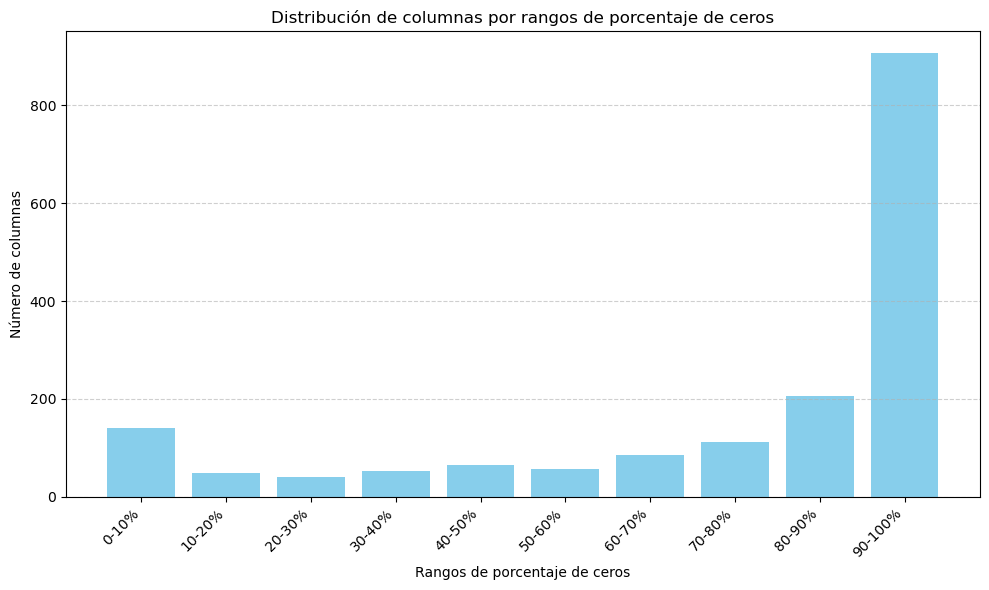

Rango 0-10%:
  - hsa-mir-1-2
  - hsa-mir-106a
  - hsa-mir-1180
  - hsa-mir-1245a
  - hsa-mir-1247
  - hsa-mir-1248
  - hsa-mir-1249
  - hsa-mir-1266
  - hsa-mir-1271
  - hsa-mir-1296
  - hsa-mir-1301
  - hsa-mir-1306
  - hsa-mir-135b
  - hsa-mir-136
  - hsa-mir-1468
  - hsa-mir-151b
  - hsa-mir-153-2
  - hsa-mir-154
  - hsa-mir-184
  - hsa-mir-187
  - hsa-mir-188
  - hsa-mir-18a
  - hsa-mir-190a
  - hsa-mir-190b
  - hsa-mir-1976
  - hsa-mir-203b
  - hsa-mir-20b
  - hsa-mir-2110
  - hsa-mir-212
  - hsa-mir-215
  - hsa-mir-217
  - hsa-mir-219a-1
  - hsa-mir-224
  - hsa-mir-296
  - hsa-mir-299
  - hsa-mir-301a
  - hsa-mir-31
  - hsa-mir-3127
  - hsa-mir-3170
  - hsa-mir-3200
  - hsa-mir-320b-1
  - hsa-mir-320b-2
  - hsa-mir-323a
  - hsa-mir-323b
  - hsa-mir-326
  - hsa-mir-335
  - hsa-mir-33a
  - hsa-mir-33b
  - hsa-mir-34b
  - hsa-mir-34c
  - hsa-mir-3605
  - hsa-mir-3613
  - hsa-mir-3614
  - hsa-mir-3615
  - hsa-mir-362
  - hsa-mir-363
  - hsa-mir-3653
  - hsa-mir-3677
  - hsa-mir-369
 

In [60]:
# 4.2 Analizar la presencia de ceros. Por columna.
zeros_count = {}

for column in df_final.columns:
    zeros_count[column] = (df_final[column] == 0).sum()

# Se filtran solo las columnas con número de ceros distinto de cero
non_zero_count_columns = {column: count for column, count in zeros_count.items() if count != 0}

# Número total de muestras
total_raws = 1155

# Se calcula el porcentaje de ceros para cada columna
percentages = {col: (zeros / total_raws) * 100 for col, zeros in non_zero_count_columns.items()}

# Se definen los rangos de porcentaje de ceros
ranges = [
    ('0-10%', lambda pct: 0 <= pct < 10),
    ('10-20%', lambda pct: 10 <= pct < 20),
    ('20-30%', lambda pct: 20 <= pct < 30),
    ('30-40%', lambda pct: 30 <= pct < 40),
    ('40-50%', lambda pct: 40 <= pct < 50),
    ('50-60%', lambda pct: 50 <= pct < 60),
    ('60-70%', lambda pct: 60 <= pct < 70),
    ('70-80%', lambda pct: 70 <= pct < 80),
    ('80-90%', lambda pct: 80 <= pct < 90),
    ('90-100%', lambda pct: 90 <= pct <= 100)
]

# Se cuentan y se agrupan las columnas en cada rango
cols_per_range = {rango[0]: [] for rango in ranges}

for col, pct in percentages.items():
    for rango in ranges:
        if rango[1](pct):
            cols_per_range[rango[0]].append(col)

# Se preparan los datos para el gráfico
ranges_labels = list(cols_per_range.keys())
ranges_counts = [len(cols_per_range[rango]) for rango in ranges_labels]

# Se crea el gráfico de barras
plt.figure(figsize = (10, 6))
plt.bar(ranges_labels, ranges_counts, color = 'skyblue')
plt.xlabel('Rangos de porcentaje de ceros')
plt.ylabel('Número de columnas')
plt.title('Distribución de columnas por rangos de porcentaje de ceros')
plt.xticks(rotation = 45, ha = 'right')
plt.grid(axis = 'y', linestyle = '--', alpha = 0.6)
plt.tight_layout()

# Se muestra el gráfico
plt.show()

# Se muestran las columnas en cada rango
for rango, cols in cols_per_range.items():
    print(f"Rango {rango}:")
    for col in cols:
        print(f"  - {col}")

Con la gráfica anterior se observa que cerca de 1000 columnas, su mayor porcentaje en valor (entre el 90% y 100% de sus valores) es de cero. Esto quiere decir, por ejemplo, que aproximadamente en 140 columnas (características), la mayoría de sus valores son distintos de 0, o solo tienen entre 0 y 10% de ceros, por lo que se elige el primer plot para comenzar a trabajar con él.

In [62]:
print(cols_per_range)

{'0-10%': ['hsa-mir-1-2', 'hsa-mir-106a', 'hsa-mir-1180', 'hsa-mir-1245a', 'hsa-mir-1247', 'hsa-mir-1248', 'hsa-mir-1249', 'hsa-mir-1266', 'hsa-mir-1271', 'hsa-mir-1296', 'hsa-mir-1301', 'hsa-mir-1306', 'hsa-mir-135b', 'hsa-mir-136', 'hsa-mir-1468', 'hsa-mir-151b', 'hsa-mir-153-2', 'hsa-mir-154', 'hsa-mir-184', 'hsa-mir-187', 'hsa-mir-188', 'hsa-mir-18a', 'hsa-mir-190a', 'hsa-mir-190b', 'hsa-mir-1976', 'hsa-mir-203b', 'hsa-mir-20b', 'hsa-mir-2110', 'hsa-mir-212', 'hsa-mir-215', 'hsa-mir-217', 'hsa-mir-219a-1', 'hsa-mir-224', 'hsa-mir-296', 'hsa-mir-299', 'hsa-mir-301a', 'hsa-mir-31', 'hsa-mir-3127', 'hsa-mir-3170', 'hsa-mir-3200', 'hsa-mir-320b-1', 'hsa-mir-320b-2', 'hsa-mir-323a', 'hsa-mir-323b', 'hsa-mir-326', 'hsa-mir-335', 'hsa-mir-33a', 'hsa-mir-33b', 'hsa-mir-34b', 'hsa-mir-34c', 'hsa-mir-3605', 'hsa-mir-3613', 'hsa-mir-3614', 'hsa-mir-3615', 'hsa-mir-362', 'hsa-mir-363', 'hsa-mir-3653', 'hsa-mir-3677', 'hsa-mir-369', 'hsa-mir-370', 'hsa-mir-376c', 'hsa-mir-377', 'hsa-mir-378c', 

In [63]:
# Se extraen las columnas que forman parte del primer plot y se crea un nuevo dataframe solo con esas columnas.
# A esas columnas se añaden 'Sample_type' y 'Stage' ya que son variables necesarias para el cálculo final

columns_0_10 = ['Sample_barcode', 'hsa-mir-1-2', 'hsa-mir-106a', 'hsa-mir-1180', 'hsa-mir-1245a', 'hsa-mir-1247', 'hsa-mir-1248', 'hsa-mir-1249', 'hsa-mir-1266', 'hsa-mir-1271', 'hsa-mir-1296', 'hsa-mir-1301', 'hsa-mir-1306', 'hsa-mir-135b', 'hsa-mir-136', 'hsa-mir-1468', 'hsa-mir-151b', 'hsa-mir-153-2', 'hsa-mir-154', 'hsa-mir-184', 'hsa-mir-187', 'hsa-mir-188', 'hsa-mir-18a', 'hsa-mir-190a', 'hsa-mir-190b', 'hsa-mir-1976', 'hsa-mir-203b', 'hsa-mir-20b', 'hsa-mir-2110', 'hsa-mir-212', 'hsa-mir-215', 'hsa-mir-217', 'hsa-mir-219a-1', 'hsa-mir-224', 'hsa-mir-296', 'hsa-mir-299', 'hsa-mir-301a', 'hsa-mir-31', 'hsa-mir-3127', 'hsa-mir-3170', 'hsa-mir-3200', 'hsa-mir-320b-1', 'hsa-mir-320b-2', 'hsa-mir-323a', 'hsa-mir-323b', 'hsa-mir-326', 'hsa-mir-335', 'hsa-mir-33a', 'hsa-mir-33b', 'hsa-mir-34b', 'hsa-mir-34c', 'hsa-mir-3605', 'hsa-mir-3613', 'hsa-mir-3614', 'hsa-mir-3615', 'hsa-mir-362', 'hsa-mir-363', 'hsa-mir-3653', 'hsa-mir-3677', 'hsa-mir-369', 'hsa-mir-370', 'hsa-mir-376c', 'hsa-mir-377', 'hsa-mir-378c', 'hsa-mir-381', 'hsa-mir-382', 'hsa-mir-3913-1', 'hsa-mir-3913-2', 'hsa-mir-3928', 'hsa-mir-3934', 'hsa-mir-409', 'hsa-mir-410', 'hsa-mir-411', 'hsa-mir-412', 'hsa-mir-421', 'hsa-mir-429', 'hsa-mir-431', 'hsa-mir-432', 'hsa-mir-450a-1', 'hsa-mir-450a-2', 'hsa-mir-450b', 'hsa-mir-4661', 'hsa-mir-4662a', 'hsa-mir-4668', 'hsa-mir-4728', 'hsa-mir-4746', 'hsa-mir-4772', 'hsa-mir-483', 'hsa-mir-485', 'hsa-mir-486-1', 'hsa-mir-486-2', 'hsa-mir-487b', 'hsa-mir-491', 'hsa-mir-493', 'hsa-mir-495', 'hsa-mir-496', 'hsa-mir-5000', 'hsa-mir-500b', 'hsa-mir-502', 'hsa-mir-503', 'hsa-mir-508', 'hsa-mir-511', 'hsa-mir-539', 'hsa-mir-550a-1', 'hsa-mir-550a-2', 'hsa-mir-5586', 'hsa-mir-5683', 'hsa-mir-590', 'hsa-mir-615', 'hsa-mir-616', 'hsa-mir-627', 'hsa-mir-642a', 'hsa-mir-651', 'hsa-mir-6511b-1', 'hsa-mir-6511b-2', 'hsa-mir-652', 'hsa-mir-653', 'hsa-mir-654', 'hsa-mir-655', 'hsa-mir-659', 'hsa-mir-664b', 'hsa-mir-675', 'hsa-mir-6892', 'hsa-mir-758', 'hsa-mir-760', 'hsa-mir-766', 'hsa-mir-7706', 'hsa-mir-887', 'hsa-mir-889', 'hsa-mir-937', 'hsa-mir-940', 'hsa-mir-942', 'hsa-mir-95', 'hsa-mir-96', 'Sample_type', 'Stage', 'Bacteroidales', 'Burkholderiales', 'Clostridiales', 'Enterobacteriales', 'Lactobacillales', 'Pseudomonadales', 'Rhizobiales', 'Sphingomonadales']

df_columns_0_10 = df_final[columns_0_10].copy()

df_columns_0_10.shape

(1155, 144)

In [64]:
df_columns_0_10.head(5)

,Sample_barcode,hsa-mir-1-2,hsa-mir-106a,hsa-mir-1180,hsa-mir-1245a,hsa-mir-1247,hsa-mir-1248,hsa-mir-1249,hsa-mir-1266,hsa-mir-1271,...,Sample_type,Stage,Bacteroidales,Burkholderiales,Clostridiales,Enterobacteriales,Lactobacillales,Pseudomonadales,Rhizobiales,Sphingomonadales
0,TCGA-E9-A1NI-01A,1.626492,3.757629,4.451286,2.371622,4.058065,2.046637,2.371622,3.964703,2.860534,...,Primary Tumor,II,0.000000,0.051020,0.020408,0.091837,0.040816,0.030612,0.030612,0.051020
1,TCGA-A1-A0SP-01A,3.338596,6.534470,3.088728,2.249060,3.901342,2.076382,1.653055,4.343756,2.669587,...,Primary Tumor,II,0.039773,0.073864,0.051136,0.079545,0.022727,0.034091,0.022727,0.017045
2,TCGA-LL-A5YP-01A,1.598989,3.701189,3.584012,2.754826,3.105999,1.010533,0.000000,4.543645,2.186276,...,Primary Tumor,II,0.047619,0.062271,0.032967,0.054945,0.032967,0.113553,0.058608,0.032967
3,TCGA-E2-A14T-01A,0.594245,3.548846,2.344106,1.603468,5.135399,1.827173,1.603468,3.068738,1.185362,...,Primary Tumor,II,0.015789,0.084211,0.047368,0.052632,0.005263,0.047368,0.042105,0.026316
4,TCGA-AR-A24O-01A,1.215313,4.112999,2.927813,0.911711,5.051656,1.466000,2.030146,4.184666,2.030146,...,Primary Tumor,III,0.000000,0.087302,0.031746,0.055556,0.000000,0.055556,0.063492,0.047619


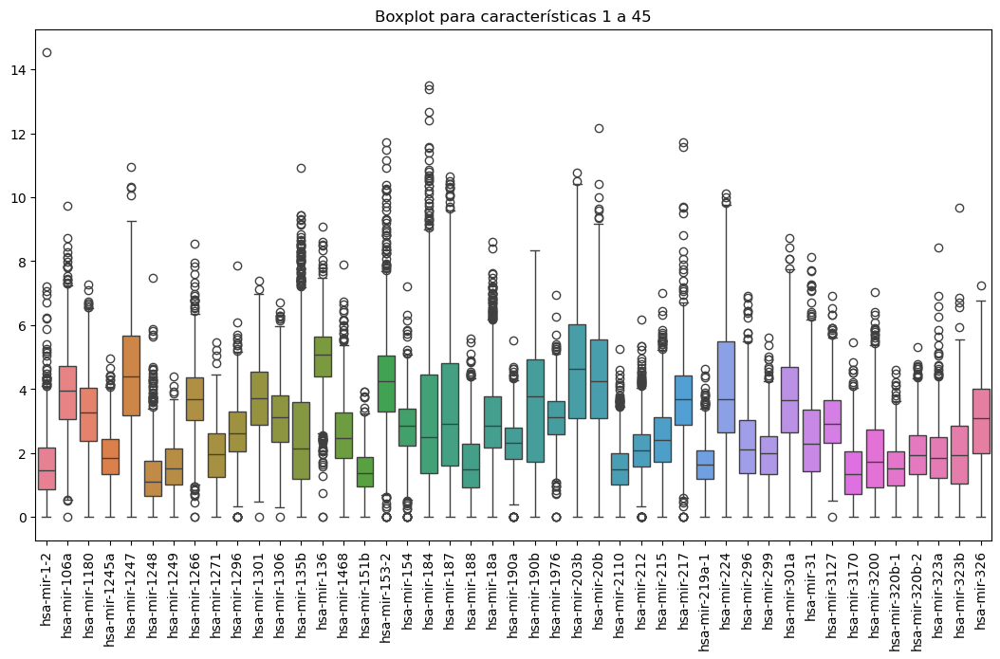

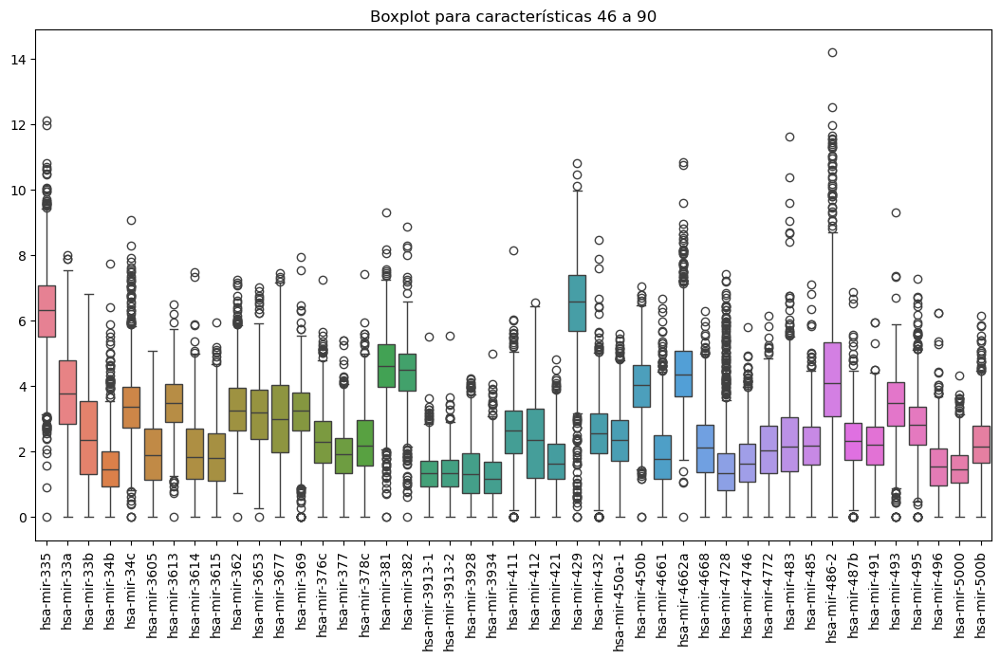

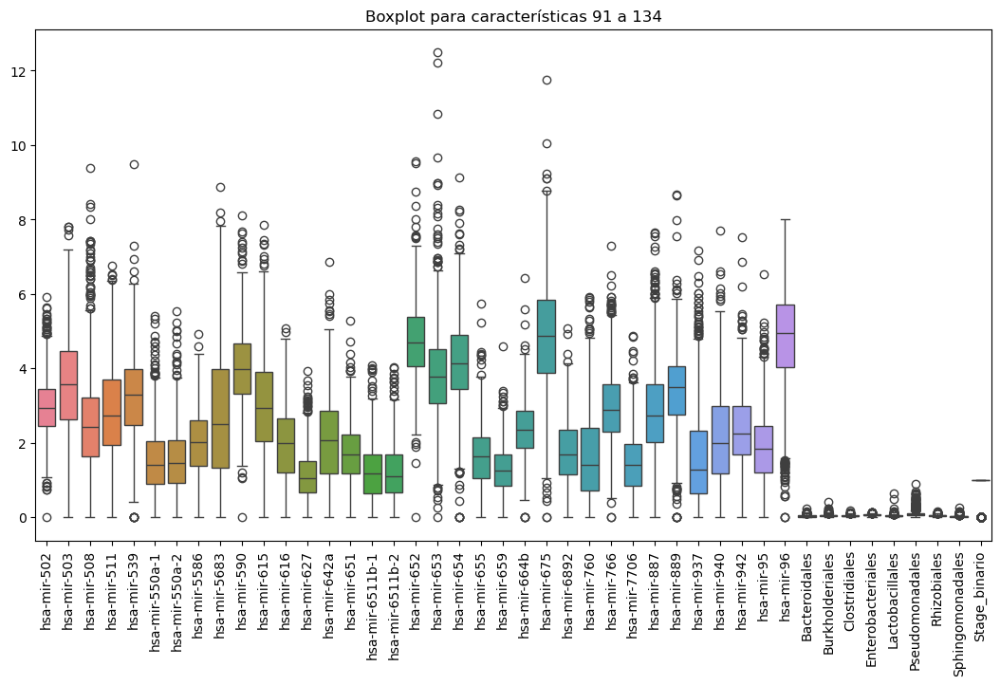

In [192]:
# 3.3 Analizar la presencia de valores atípicos

# Se toman solo las variables numéricas, es decir, se excluye del cálculo la variable 'Sample_type' y 'Stage':
df_columns_0_10_numeric = df_columns_0_10.select_dtypes(include = ['number'])

# Se crea función para mostrar boxplots en grupos
def plot_boxplots_in_groups(df, group_size):
    num_features = df.shape[1]
    num_groups = (num_features // group_size) + 1

    for i in range(num_groups):
        # Definir las características para este grupo
        start_col = i * group_size
        end_col = min((i + 1) * group_size, num_features)

        # Seleccionar las columnas para este grupo
        df_subset = df.iloc[:, start_col:end_col]

        # Crear el boxplot para este grupo
        plt.figure(figsize = (13, 7))
        sns.boxplot(data = df_subset)
        plt.title(f'Boxplot para características {start_col + 1} a {end_col}')
        plt.xticks(rotation=90)  # Rotar los nombres de las columnas si es necesario
        plt.show()

# Se llama a la función para graficar en grupos
plot_boxplots_in_groups(df_columns_0_10_numeric, 45)

Se decide no realizar acciones para los datos atípicos detectados debido a que no se conoce si se deben a muestras defectuosas o a valores reales medidos.

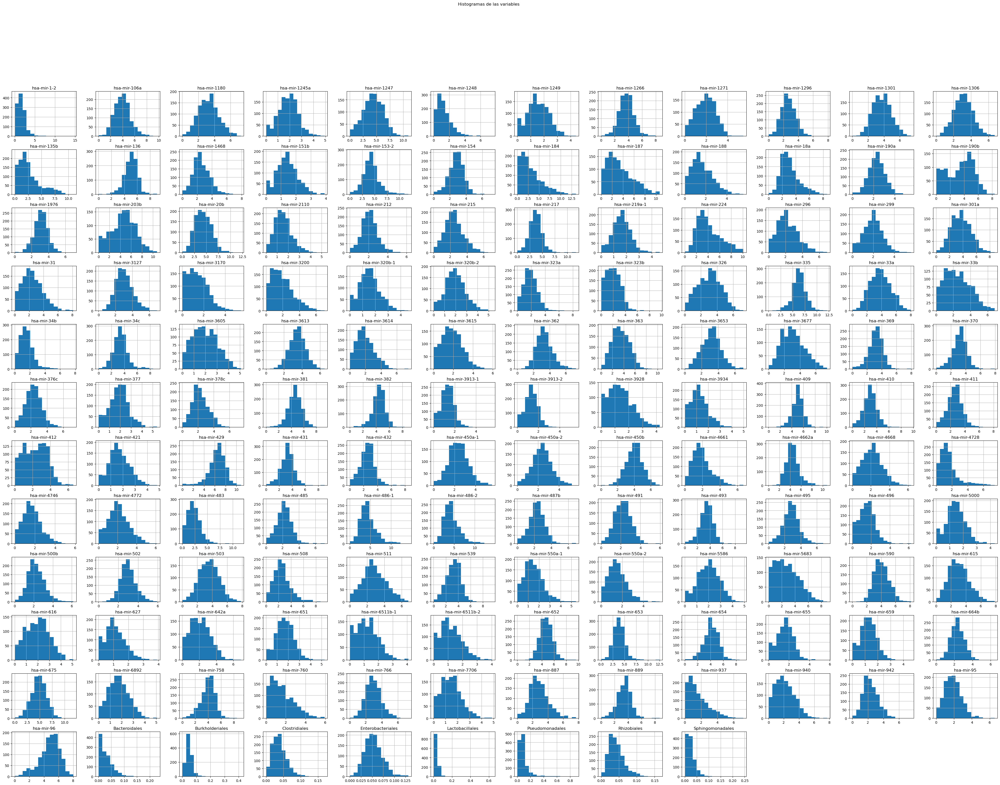

In [67]:
# 4. Distribución de las variables

# Se crea un histograma para cada columna
df_columns_0_10.hist(bins = 15, figsize = (50, 35))
plt.suptitle('Histogramas de las variables')
# Se guarda en un archivo como imagen para adjuntarlo en la memoria
plt.savefig('histogramas_variables.png')
plt.show()

Se indican la conclusiones en la memoria.

In [69]:
# 5. Relación entre variables

# Se calcula la matriz de correlación
numeric_columns = df_columns_0_10.select_dtypes(include = ['number']).columns
df_only_numeric_columns = df_columns_0_10[numeric_columns].copy()
matriz_correlacion = df_only_numeric_columns.corr()

# Se genera CSV con la matriz de correlación para una mejor visualización y análisis
matriz_correlacion.to_csv('matriz_correlacion.csv')

Tras analizar la matriz de correlación, se observan las siguientes relaciones fuertes entre variables (valores cercanos a 1 o -1):

- hsa-mir-20b y hsa-mir-363: 0,828830306889697
- hsa-mir-758 y hsa-mir-370: 0,802986383406731
- hsa-mir-370 y hsa-mir-382: 0,851583545434597
- hsa-mir-758 y hsa-mir-382: 0,817336041301399
- hsa-mir-382 y hsa-mir-409: 0,863498705793891
- hsa-mir-758 y hsa-mir-410: 0,800835572847932
- hsa-mir-758 y hsa-mir-431: 0,801083624389161
- hsa-mir-450a-1 y hsa-mir-450a-2: 0,830585205261399
- hsa-mir-486-2 y hsa-mir-486-1: 0,980576657922633

Se han encontrado 9 pares de variables con alta correlación, por lo que solo nos quedaremos con una de ella. En este caso, se elegirá aquella variable que tenga menos ceros. Se procede a almacenar en una lista las variables que contienen mayor número de ceros para eliminarlas del dataset:

In [72]:
high_corr_pairs = [('hsa-mir-20b', 'hsa-mir-363'), ('hsa-mir-758', 'hsa-mir-370'), ('hsa-mir-370', 'hsa-mir-382'),
                  ('hsa-mir-758', 'hsa-mir-382'), ('hsa-mir-382', 'hsa-mir-409'), ('hsa-mir-758', 'hsa-mir-410'), 
                   ('hsa-mir-758', 'hsa-mir-431'), ('hsa-mir-450a-1', 'hsa-mir-450a-2'), ('hsa-mir-486-2', 'hsa-mir-486-1')]

def count_zeros(series):
    return (series == 0).sum()

# Se itera sobre los pares de variables con alta correlación y se selecciona la variable con más ceros
variables_to_quit = []
for var1, var2 in high_corr_pairs:
    zeros_var1 = count_zeros(df_only_numeric_columns[var1])
    zeros_var2 = count_zeros(df_only_numeric_columns[var2])
    if zeros_var1 > zeros_var2:
        variables_to_quit.append(var1)
    else:
        variables_to_quit.append(var2)

# Se eliminan duplicados en caso de que la misma variable se seleccione en múltiples pares
variables_to_quit = list(set(variables_to_quit))

print(variables_to_quit)

['hsa-mir-758', 'hsa-mir-486-1', 'hsa-mir-410', 'hsa-mir-450a-2', 'hsa-mir-431', 'hsa-mir-363', 'hsa-mir-370', 'hsa-mir-409']


Se eliminan las variables indicadas anteriormente por tener alta correlación con otras variables y tener mayor número de ceros:

In [74]:
df_columns_0_10.shape

(1155, 144)

In [75]:
for var in variables_to_quit:
    df_columns_0_10.drop(var, axis = 1, inplace = True)

df_columns_0_10.shape

(1155, 136)

El resultado es un dataframe con 1155 filas y 136 columnas.

In [77]:
df_columns_0_10.head(5)

,Sample_barcode,hsa-mir-1-2,hsa-mir-106a,hsa-mir-1180,hsa-mir-1245a,hsa-mir-1247,hsa-mir-1248,hsa-mir-1249,hsa-mir-1266,hsa-mir-1271,...,Sample_type,Stage,Bacteroidales,Burkholderiales,Clostridiales,Enterobacteriales,Lactobacillales,Pseudomonadales,Rhizobiales,Sphingomonadales
0,TCGA-E9-A1NI-01A,1.626492,3.757629,4.451286,2.371622,4.058065,2.046637,2.371622,3.964703,2.860534,...,Primary Tumor,II,0.000000,0.051020,0.020408,0.091837,0.040816,0.030612,0.030612,0.051020
1,TCGA-A1-A0SP-01A,3.338596,6.534470,3.088728,2.249060,3.901342,2.076382,1.653055,4.343756,2.669587,...,Primary Tumor,II,0.039773,0.073864,0.051136,0.079545,0.022727,0.034091,0.022727,0.017045
2,TCGA-LL-A5YP-01A,1.598989,3.701189,3.584012,2.754826,3.105999,1.010533,0.000000,4.543645,2.186276,...,Primary Tumor,II,0.047619,0.062271,0.032967,0.054945,0.032967,0.113553,0.058608,0.032967
3,TCGA-E2-A14T-01A,0.594245,3.548846,2.344106,1.603468,5.135399,1.827173,1.603468,3.068738,1.185362,...,Primary Tumor,II,0.015789,0.084211,0.047368,0.052632,0.005263,0.047368,0.042105,0.026316
4,TCGA-AR-A24O-01A,1.215313,4.112999,2.927813,0.911711,5.051656,1.466000,2.030146,4.184666,2.030146,...,Primary Tumor,III,0.000000,0.087302,0.031746,0.055556,0.000000,0.055556,0.063492,0.047619


In [78]:
# 7. Balanceo de clases:

# Se cuentan las ocurrencias de cada clase para la columna 'Sample_type'
class_counts = df_columns_0_10['Sample_type'].value_counts()
print(class_counts)

# Se calcula el porcentaje de cada clase
class_percentages = df_columns_0_10['Sample_type'].value_counts(normalize = True) * 100
print(class_percentages)

Primary Tumor          1051
Solid Tissue Normal     104
Name: Sample_type, dtype: int64
Primary Tumor          90.995671
Solid Tissue Normal     9.004329
Name: Sample_type, dtype: float64


El resultado anterior nos indica que las clases que indican si está enfermo o no, se encuentran desbalanceadas ya que el 91% aprox de las 1155 muestras pertenecen a personas enfermas, y el 9% pertenecen a personas sanas.

In [80]:
# Se cuentan las ocurrencias de cada clase en la columna 'Stage'
class_counts = df_columns_0_10['Stage'].value_counts()
print(class_counts)

# Se calcula el porcentaje de cada clase
class_percentages = df_columns_0_10['Stage'].value_counts(normalize = True) * 100
print(class_percentages)

II     608
III    243
I      181
IV      19
Name: Stage, dtype: int64
II     57.849667
III    23.120837
I      17.221694
IV      1.807802
Name: Stage, dtype: float64


Respecto al tipo de estadio, se observa que el 17,2% de las muestras pertenecen a un estadio I; el 57,85% pertenecen al estadio II; el 23,1% pertenecen al estadio III; el 1,8% pertenecen al estadio IV.

Se puede concluir que existe un desbalanceo entre los diferentes estadios.

Se procede a crear el modelo de clasificación binaria que determina si la muestra pertenece a paciente sano o enfermo (variable de salida Sample_type; 1 = enfermo; 0 = sano)

In [83]:
# Antes de comenzar con el modelo, se procede a dividir la variable Stage en dos columnas binarias: early_stage = 1 y advanced_stage = 0
# esta variable se utilizará en trabajos futuros donde se creen modelos que permitan discernir si una muestra para paciente enfermo pertenecen a un estadio temprano o avanzado

# Crear las columnas binarias Early_stage y Advanced_stage
df_columns_0_10['Stage_binario'] = df_columns_0_10.apply(lambda row: 1 if row['Sample_type'] == 'Primary Tumor' and row['Stage'] in ['I', 'II'] else (0 if row['Sample_type'] == 'Primary Tumor' and row['Stage'] in ['III', 'IV'] else None), axis=1)

# Se elimina la variable original 'Stage' del dataset:
df_columns_0_10.drop('Stage', axis = 1, inplace = True)

df_columns_0_10.head(5)

,Sample_barcode,hsa-mir-1-2,hsa-mir-106a,hsa-mir-1180,hsa-mir-1245a,hsa-mir-1247,hsa-mir-1248,hsa-mir-1249,hsa-mir-1266,hsa-mir-1271,...,Sample_type,Bacteroidales,Burkholderiales,Clostridiales,Enterobacteriales,Lactobacillales,Pseudomonadales,Rhizobiales,Sphingomonadales,Stage_binario
0,TCGA-E9-A1NI-01A,1.626492,3.757629,4.451286,2.371622,4.058065,2.046637,2.371622,3.964703,2.860534,...,Primary Tumor,0.000000,0.051020,0.020408,0.091837,0.040816,0.030612,0.030612,0.051020,1.0
1,TCGA-A1-A0SP-01A,3.338596,6.534470,3.088728,2.249060,3.901342,2.076382,1.653055,4.343756,2.669587,...,Primary Tumor,0.039773,0.073864,0.051136,0.079545,0.022727,0.034091,0.022727,0.017045,1.0
2,TCGA-LL-A5YP-01A,1.598989,3.701189,3.584012,2.754826,3.105999,1.010533,0.000000,4.543645,2.186276,...,Primary Tumor,0.047619,0.062271,0.032967,0.054945,0.032967,0.113553,0.058608,0.032967,1.0
3,TCGA-E2-A14T-01A,0.594245,3.548846,2.344106,1.603468,5.135399,1.827173,1.603468,3.068738,1.185362,...,Primary Tumor,0.015789,0.084211,0.047368,0.052632,0.005263,0.047368,0.042105,0.026316,1.0
4,TCGA-AR-A24O-01A,1.215313,4.112999,2.927813,0.911711,5.051656,1.466000,2.030146,4.184666,2.030146,...,Primary Tumor,0.000000,0.087302,0.031746,0.055556,0.000000,0.055556,0.063492,0.047619,0.0


Siempre que la variable Early_stage_binario tome el valor 1 quiere decir que la muestra pertenece a un estadio temprano (I o II). Si toma valor 0, quiere decir que la muestra pertenece a un estadio tardío (III o IV). Si toma valor nulo quiere decir que la muestra pertenece a paciente sano.

Antes de comenzar con el modelo, se procede a normalizar las variables. Solo se van a normalizar las variables de microARN con un tipo estándar, las variables de bacterias no se normalizan ya que ya se encuentran en porcentaje y no es necesario.

In [86]:
scaler = StandardScaler()

# Se indican los valores de control para extraer en una lista las variables a normalizar
init_col_normalize = 'hsa-mir-1-2'
end_col_normalize = 'hsa-mir-96'

columns_to_normalize = []

# Se encuentra el índice de la columna de inicio
init = df_columns_0_10.columns.get_loc(init_col_normalize)

# Se recorren todas las columnas desde la columna de inicio hasta la columna establecida como la final
for col in df_columns_0_10.columns[init:]:
    columns_to_normalize.append(col)
    if col == end_col_normalize:
        print(f"Columna objetivo '{end_col_normalize}' encontrada. Deteniendo el bucle.")
        break

df_normalized = df_columns_0_10.copy()
df_normalized[columns_to_normalize] = scaler.fit_transform(df_columns_0_10[columns_to_normalize])

df_normalized.head(5)

Columna objetivo 'hsa-mir-96' encontrada. Deteniendo el bucle.


,Sample_barcode,hsa-mir-1-2,hsa-mir-106a,hsa-mir-1180,hsa-mir-1245a,hsa-mir-1247,hsa-mir-1248,hsa-mir-1249,hsa-mir-1266,hsa-mir-1271,...,Sample_type,Bacteroidales,Burkholderiales,Clostridiales,Enterobacteriales,Lactobacillales,Pseudomonadales,Rhizobiales,Sphingomonadales,Stage_binario
0,TCGA-E9-A1NI-01A,0.035692,-0.156557,0.940187,0.616206,-0.170854,0.777113,1.016906,0.235306,1.005083,...,Primary Tumor,0.000000,0.051020,0.020408,0.091837,0.040816,0.030612,0.030612,0.051020,1.0
1,TCGA-A1-A0SP-01A,1.575081,1.954454,-0.149262,0.469242,-0.256324,0.808309,0.118343,0.581321,0.797260,...,Primary Tumor,0.039773,0.073864,0.051136,0.079545,0.022727,0.034091,0.022727,0.017045,1.0
2,TCGA-LL-A5YP-01A,0.010964,-0.199464,0.246748,1.075707,-0.690066,-0.309530,-1.948790,0.763789,0.271233,...,Primary Tumor,0.047619,0.062271,0.032967,0.054945,0.032967,0.113553,0.058608,0.032967,1.0
3,TCGA-E2-A14T-01A,-0.892424,-0.315278,-0.744634,-0.304889,0.416672,0.546944,0.056334,-0.582567,-0.818145,...,Primary Tumor,0.015789,0.084211,0.047368,0.052632,0.005263,0.047368,0.042105,0.026316,1.0
4,TCGA-AR-A24O-01A,-0.334008,0.113602,-0.277924,-1.134376,0.371002,0.168154,0.589893,0.436097,0.101303,...,Primary Tumor,0.000000,0.087302,0.031746,0.055556,0.000000,0.055556,0.063492,0.047619,0.0


Se observa el resultado del dataframe tras haber sido normalizado para las columnas de microARN.

# MODELO 1:

- Modelo de clasificación binaria que determina si la muestra pertenece a paciente sano o enfermo (variable de salida Sample_type; 1 = enfermo; 0 = sano)

In [89]:
# Se crea un mapa de calor con el fin de analizar la correlación entre las distintas variables con la variable objetivo
# Antes de crear el mapa, se seleccionan solo las variables numéricas
df_normalized_numeric_cols = df_normalized.select_dtypes(include = ['number'])

# y se transforma la variable objetivo "Sample_type" en una variable binaria donde "Primary tumor" = enfermo = 1; "Solid Tissue normal" = sano = 0
df_normalized['Sample_type_binario'] = df_normalized['Sample_type'].apply(lambda x: 1 if x == 'Primary Tumor' else 0)

/var/folders/91/7m2qrcfn78zbsqr3m2xs5rcc0000gn/T/ipykernel_36242/103132085.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_normalized['Sample_type_binario'] = df_normalized['Sample_type'].apply(lambda x: 1 if x == 'Primary Tumor' else 0)


In [90]:
# Se elimina la variable "Sample_type" original:
df_normalized.drop('Sample_type', axis = 1, inplace = True)

# Se calculan las correlaciones de todas las variables con respecto a la variable objetivo 'Sample_type_binario'
correlations = df_normalized_numeric_cols.corrwith(df_normalized['Sample_type_binario'])

# Se ordenan las correlaciones por valor absoluto para ver las más altas en magnitud
correlations = correlations.abs().sort_values(ascending = False)

# Se muestran las características más correlacionadas con la variable objetivo
print("Características más correlacionadas con la variable objetivo:")
print(correlations)

Características más correlacionadas con la variable objetivo:
hsa-mir-96       0.587127
hsa-mir-486-2    0.582745
hsa-mir-429      0.515552
hsa-mir-378c     0.457063
hsa-mir-5683     0.412759
                   ...   
hsa-mir-362      0.007286
hsa-mir-642a     0.004718
hsa-mir-212      0.004188
hsa-mir-3653     0.001646
Stage_binario         NaN
Length: 134, dtype: float64


Tras calcular las correlaciones entre las distintas features y la variable objetivo del primer modelo ("Sample_type"), se observa que no existen variables con alta correlación. La mayor tiene 0.58 (hsa-mir-96). En este caso, no es necesario realizar acciones, se mantienen las variables seleccionadas hasta ahora.

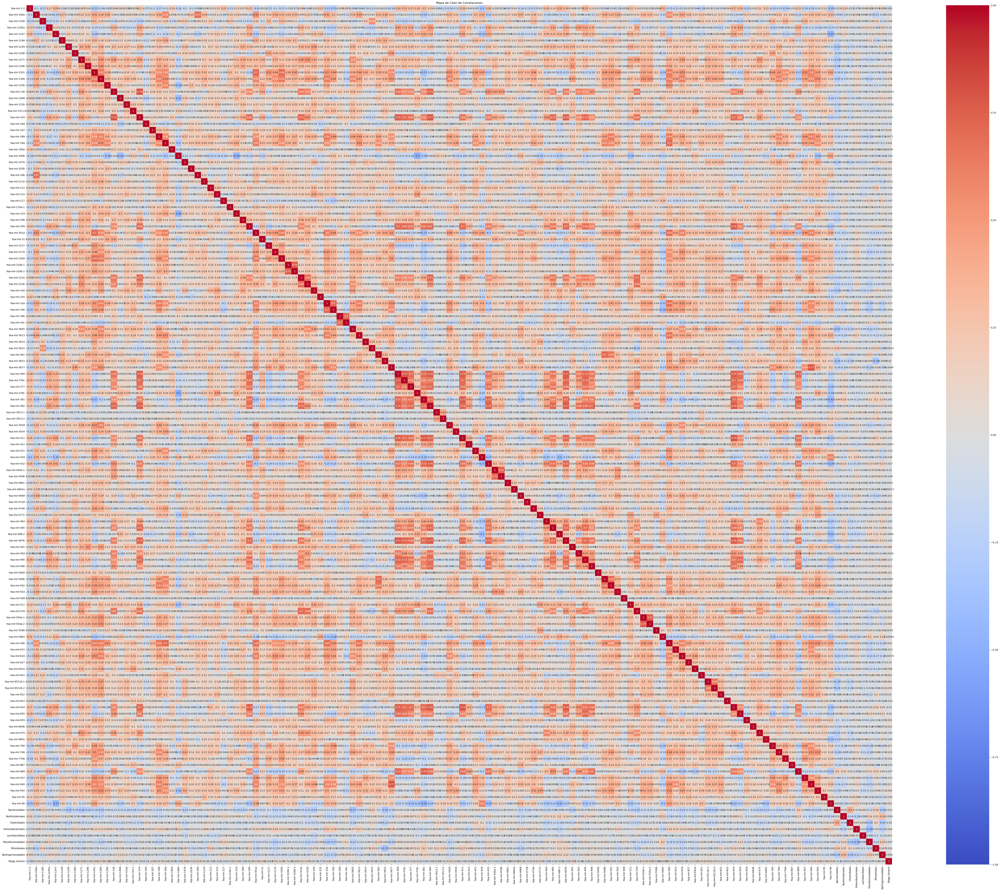

In [92]:
# Se crea mapa de calor para una visualización gráfica de las correlaciones

# Se calcula la matriz de correlación
correlation_matrix = df_normalized_numeric_cols.corr()

# Se configura el tamaño del gráfico
plt.figure(figsize = (80, 64))

# Se crea el mapa de calor usando Seaborn
sns.heatmap(correlation_matrix, annot = True, cmap = 'coolwarm', vmin = -1, vmax = 1)

# Se añade título al gráfico
plt.title('Mapa de Calor de Correlaciones')

# Se muestra el gráfico
plt.show()

Si se observa la última fila, correspondiente a la variable "Sample_type_binario", se puede observar el mismo resultado mencionado anteriormente.

In [94]:
# Se procede a dividir los datos en entrenamiento y test para el modelo

# Se indican los valores de control para extraer las features, las cuales están formadas por los microARN y las bacterias
init_col_features = 'hsa-mir-1-2'
end_col_features = 'Sphingomonadales'

features = []

# Se encuentra el índice de la columna de inicio
init = df_normalized.columns.get_loc(init_col_features)

# Se recorren todas las columnas desde la columna de inicio hasta la columna establecida como la final para crear una lista con las features
for col in df_normalized.columns[init:]:
    features.append(col)
    if col == end_col_features:
        print(f"Columna objetivo '{end_col}' encontrada. Deteniendo el bucle.")
        break

print(features)

Columna objetivo 'Synergistales' encontrada. Deteniendo el bucle.
['hsa-mir-1-2', 'hsa-mir-106a', 'hsa-mir-1180', 'hsa-mir-1245a', 'hsa-mir-1247', 'hsa-mir-1248', 'hsa-mir-1249', 'hsa-mir-1266', 'hsa-mir-1271', 'hsa-mir-1296', 'hsa-mir-1301', 'hsa-mir-1306', 'hsa-mir-135b', 'hsa-mir-136', 'hsa-mir-1468', 'hsa-mir-151b', 'hsa-mir-153-2', 'hsa-mir-154', 'hsa-mir-184', 'hsa-mir-187', 'hsa-mir-188', 'hsa-mir-18a', 'hsa-mir-190a', 'hsa-mir-190b', 'hsa-mir-1976', 'hsa-mir-203b', 'hsa-mir-20b', 'hsa-mir-2110', 'hsa-mir-212', 'hsa-mir-215', 'hsa-mir-217', 'hsa-mir-219a-1', 'hsa-mir-224', 'hsa-mir-296', 'hsa-mir-299', 'hsa-mir-301a', 'hsa-mir-31', 'hsa-mir-3127', 'hsa-mir-3170', 'hsa-mir-3200', 'hsa-mir-320b-1', 'hsa-mir-320b-2', 'hsa-mir-323a', 'hsa-mir-323b', 'hsa-mir-326', 'hsa-mir-335', 'hsa-mir-33a', 'hsa-mir-33b', 'hsa-mir-34b', 'hsa-mir-34c', 'hsa-mir-3605', 'hsa-mir-3613', 'hsa-mir-3614', 'hsa-mir-3615', 'hsa-mir-362', 'hsa-mir-3653', 'hsa-mir-3677', 'hsa-mir-369', 'hsa-mir-376c', 'hsa-

In [95]:
# Columna objetivo para el primer modelo - Clasificación binaria: enfermo (1) vs sano (0)
target_column_model_1 = 'Sample_type_binario'

# Se dividen los datos para el primer modelo con el dataset completo
X_model_1 = df_normalized[features].copy()
y_model_1 = df_normalized[target_column_model_1].copy()

# Se dividen los datos en conjuntos de entrenamiento y test - 85% - 15%
X_train_model_1, X_test_model_1, y_train_model_1, y_test_model_1 = train_test_split(X_model_1, y_model_1, test_size = 0.15, random_state = 42, stratify = y_model_1)

In [96]:
print(y_train_model_1.value_counts())
print(y_test_model_1.value_counts())

1    893
0     88
Name: Sample_type_binario, dtype: int64
1    158
0     16
Name: Sample_type_binario, dtype: int64


Tras dividir el dataset en conjunto de entrenamiento y test, se procede a analizar la cantidad de muestras de pacientes sanos y enfermos de las que se dispone, ya que, en caso de ser insuficientes, sería necesario hacer oversampling de la clase minoritaria. Dado que la técnica de oversampling (smote) es conveniente realizarla solo sobre el conjunto de entrenamiento, el análisis del desbalanceo también se va a realizar solo sobre el conjunto de entrenamiento (X_train_model_1, y_train_model_1):

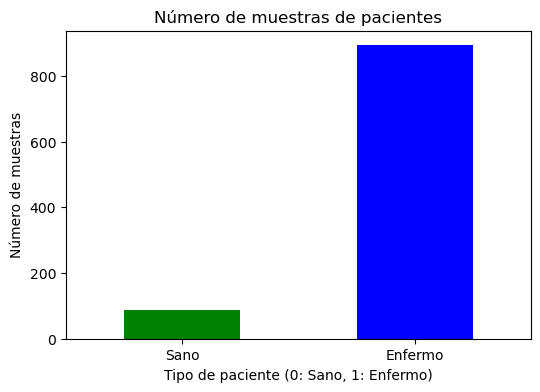

In [98]:
# Se cuentan el número de muestras por cada valor de Sample_type_binario
counts = y_train_model_1.value_counts()

# Se configura el tamaño del gráfico
plt.figure(figsize = (6, 4))

# Se crea el gráfico de barras
counts.sort_index().plot(kind = 'bar', color = ['green', 'blue'])

# Se personaliza el gráfico
plt.title('Número de muestras de pacientes')
plt.xlabel('Tipo de paciente (0: Sano, 1: Enfermo)')
plt.ylabel('Número de muestras')
plt.xticks([0, 1], ['Sano', 'Enfermo'], rotation = 0)

# Se muestra el gráfico
plt.show()

Con la gráfica anterior, se observa que existen más muestras de pacientes enfermos que de sanos. Antes de continuar con la búsqueda del modelo más óptimo, se procede a aplicar oversampling sobre la variable de sanos con el fin de igualar el volumen de muestras entre sanos y enfermos:

In [100]:
# Oversampling - Se aplica SMOTE al conjunto de entrenamiento
smote = SMOTE(sampling_strategy = 'auto', random_state = 42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_model_1, y_train_model_1)

Tras el oversampling, se procede a analizar la distribución de las muestras:

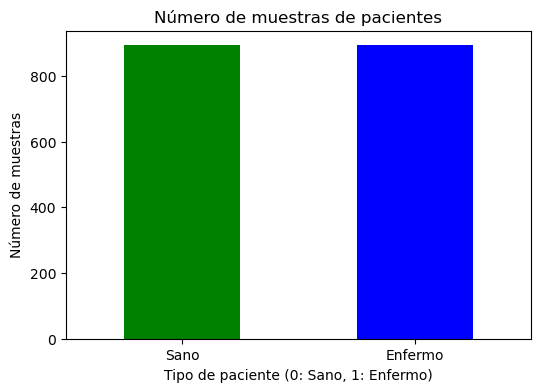

In [102]:
# Se cuentan el número de muestras por cada valor de Sample_type_binario
counts = y_train_resampled.value_counts()

# Se configura el tamaño del gráfico
plt.figure(figsize = (6, 4))

# Se crea el gráfico de barras
counts.sort_index().plot(kind = 'bar', color = ['green', 'blue'])

# Se personaliza el gráfico
plt.title('Número de muestras de pacientes')
plt.xlabel('Tipo de paciente (0: Sano, 1: Enfermo)')
plt.ylabel('Número de muestras')
plt.xticks([0, 1], ['Sano', 'Enfermo'], rotation = 0)

# Se muestra el gráfico
plt.show()

In [103]:
X_train_resampled.shape

(1786, 133)

Se observa que el número de muestras se encuentran balanceadas después de aplicar dicha técnica.

Se procede a definir el pipeline. Se va a utilizar GridSearch para la búsqueda óptima de hiperparámetros en diferentes modelos. Debido a que el número de características sigue siendo alto a pesar de haberlo reducido previamente, se procede a aplicar una técnica de selección de características con el fin de reducir la dimensionalidad.

Se utiliza esta técnica y no otras como PCA (Análisis de Componentes Principales) o Forward/Backward Selection debido a que, la técnica PCA ofrece menos interpretabilidad que RFE al crear nuevas características a partir de las existentes, y es más útil utilizarla cuando las características están correlacionadas entre sí, y ya se ha analizado y tratado previamente la correlación entre las distintas caractetísticas, así como la correlación de las características con la variable objetivo. En comparación con la técnica Forward/Backward Selection, se suele utilizar cuando se está entrenando un modelo específico y no varios modelos, ya que esta técnica no es compatible con modelos que no ofrezcan la importancia de características.

--

AÑADIR A LA MEMORIA SOBRE POR QUÉ SE HA INDICADO probability = yes en SVC: Internamente, cuando probability=True se establece, scikit-learn realiza una validación cruzada adicional en el conjunto de entrenamiento para ajustar un modelo de regresión logística sobre las salidas de la función de decisión del SVM. Esta regresión logística se utiliza para convertir las puntuaciones (márgenes de decisión) en probabilidades. Aplicaciones: Esto es útil en aplicaciones donde necesitas no solo saber la clase más probable, sino también la certeza de esa predicción. Por ejemplo, en sistemas de detección de fraudes, clasificación médica, y en otros casos donde la interpretación de las probabilidades puede ser crucial para la toma de decisiones.

In [106]:
# Se definen los distintos modelos que se van a probar
#models_1 = {
#    'lr': (
#       Pipeline([
#           ('feature_selection', RFE(estimator = LogisticRegression())),
#            ('classification', LogisticRegression())
#       ]),
#        {
#            'feature_selection__n_features_to_select': [18, 30, 40, 50],
#            'classification__C': [0.1, 1, 10, 100],
#            'classification__solver': ['newton-cg', 'lbfgs', 'liblinear'],
#            'classification__penalty': ['l2']
#        }
#    ),
    # Se usa selector de características de tipo permutación
#    'svc': (
#        Pipeline([
#            ('classification', SVC(probability = True))
#        ]),
#        {
#            'classification__C': [0.1, 1, 10, 100],
#            'classification__kernel': ['sigmoid', 'poly', 'rbf', 'linear'],
#            'classification__gamma': ['scale', 'auto']
#        }
#    ),
#    'dt' : (
#        Pipeline([
#            ('feature_selection', SelectFromModel(estimator = DecisionTreeClassifier())),
#            ('classification', DecisionTreeClassifier())
#        ]),
#        {
#             'feature_selection__threshold': ['mean', 'median', 0.001],
#             'feature_selection__max_features': [30, 40, 50],
#             'feature_selection__importance_getter': ['auto'],
#             'classification__criterion': ['gini', 'entropy'],
#             'classification__max_depth': [None, 10, 20],
#             'classification__ccp_alpha': [0.01]
#        }
#    ),
#    'rf' : (
#        Pipeline([
#            ('feature_selection', SelectFromModel(estimator = RandomForestClassifier())),
#            ('classification', RandomForestClassifier())
#        ]),
#        {
#            'feature_selection__threshold': ['mean', 'median', 0.01],
#            'feature_selection__max_features': [30, 40, 50],
#            'feature_selection__importance_getter': ['auto'],
#            'classification__n_estimators': [18, 30, 40, 50],
#            'classification__max_features': [18, 30, 40, 50],
#            'classification__max_depth': [None, 10, 20]
#        }
#    ),
#    'mlp' : (
#        Pipeline([
#            ('classification', MLPClassifier())
#        ]),
#        {
#            'classification__hidden_layer_sizes': [(50, 50, 50), (50, 100, 50), (100,)],
#            'classification__activation': ['tanh', 'relu'],
#            'classification__solver': ['sgd', 'adam'],
#            'classification__alpha': [0.0001, 0.001, 0.01, 0.05],
#            'classification__learning_rate': ['constant', 'adaptive'],
#            'classification__early_stopping': [True, False],
#            'classification__max_iter': [25, 50, 100]
#        }
#    ),
#    'knn' : (
#        Pipeline([
#            ('classification', KNeighborsClassifier())
#        ]),
#        {
#            'classification__n_neighbors': [3, 5, 7, 9, 11],
#            'classification__weights': ['uniform', 'distance'],
#            'classification__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
#            'classification__leaf_size': [20, 30, 40],
#            'classification__p': [1, 2]
#        }
#    ),
#    'nb' : (
#        Pipeline([
#            ('classification', GaussianNB()),
#        ]),
#        {
#            'classification__var_smoothing': np.logspace(0, -9, num = 100)3
#        }
#    ),
#    'AdaBoost': (
#        Pipeline([
#            ('feature_selection', SelectFromModel(estimator = AdaBoostClassifier())),
#            ('classification', AdaBoostClassifier(estimator = DecisionTreeClassifier()))
#        ]),
#        {
#            'feature_selection__threshold': ['mean', 'median', 0.01],
#            'feature_selection__max_features': [30, 40, 50],
#            'feature_selection__importance_getter': ['auto'],
#            'classification__n_estimators': [18, 30, 40, 50],
#            'classification__learning_rate': [0.01, 0.1, 1, 10],
#            'classification__algorithm': ['SAMME']
#        }
#    ),
#    'Bagging' : (
#        Pipeline([
#            ('feature_selection', SelectFromModel(estimator = RandomForestClassifier())),
#            ('classification', BaggingClassifier(estimator = RandomForestClassifier())),
#        ]),
#        {
#            'feature_selection__threshold': ['mean', 'median', 0.01],
#            'feature_selection__max_features': [18, 30, 40, 50],
#            'classification__n_estimators': [18, 30, 40, 50],
#            'classification__max_samples': [0.5, 0.75, 1.0],
#            'classification__max_features': [0.5, 0.75, 1.0],
#            'classification__bootstrap': [True, False],
#            'classification__bootstrap_features': [True, False]
#        }
#    )
#}

In [172]:
# Se modifica el selector de features a RFE-CV para todos los modelos

models_2 = {
    'lr': (
       Pipeline([
           ('feature_selection', RFECV(estimator = LogisticRegression(), step = 1, cv = 5)),
            ('classification', LogisticRegression())
       ]),
        {
            'feature_selection__estimator__C': [0.1, 1, 10, 100],
            'feature_selection__estimator__solver': ['newton-cg', 'lbfgs', 'liblinear'],
            'feature_selection__estimator__penalty': ['l2'],
            'classification__C': [0.1, 1, 10, 100],
            'classification__solver': ['newton-cg', 'lbfgs', 'liblinear'],
            'classification__penalty': ['l2']
        }
    ),
    'svc': (
        Pipeline([
            ('feature_selection', RFECV(estimator = SVC(probability = True), step = 1, cv = 5)),
            ('classification', SVC())
        ]),
        {
            'feature_selection__estimator__C': [0.1, 1, 10, 100],
            'feature_selection__estimator__kernel': ['linear'],
            'feature_selection__estimator__gamma': ['scale', 'auto'],
            'classification__C': [0.1, 1, 10, 100],
            'classification__kernel': ['linear'],
            'classification__gamma': ['scale', 'auto'],
            'classification__probability': [True]

        }
    ),
    'dt' : (
        Pipeline([
            # Se seleccionar RFE en lugar de RFECV para poder definir el parámetro n_features_to_select y evitar el error de índice not match
            ('feature_selection', RFE(estimator = DecisionTreeClassifier())),
            ('classification', DecisionTreeClassifier())
        ]),
        {
            'feature_selection__n_features_to_select': [133],
            'classification__max_depth': [None, 10],# 20],
            'classification__min_samples_split': [2, 5], #10],
            'classification__min_samples_leaf': [1], #2, 4],
        }
    ),
    'rf' : (
        Pipeline([
            ('feature_selection', RFE(estimator = RandomForestClassifier())),
            ('classification', RandomForestClassifier())
        ]),
        {
            'feature_selection__n_features_to_select': [133],
            'classification__n_estimators': [15, 20, 25, 30],
            'classification__max_features': [18, 30, 40, 50],
            'classification__max_depth': [None, 10, 20]
        }
    ),
    'mlp' : (
        Pipeline([
            ('feature_selection', RFE(estimator = DecisionTreeClassifier())),
            ('classification', MLPClassifier())
        ]),
        {
            'feature_selection__n_features_to_select': [133],
            'classification__hidden_layer_sizes': [(50, 50, 50)],
            'classification__activation': ['tanh', 'relu'],
            'classification__solver': ['adam'],
            'classification__alpha': [0.0001, 0.001, 0.01],
            'classification__learning_rate': ['adaptive'],
            'classification__early_stopping': [True],
            'classification__max_iter': [25]
        }
    ),
    'knn' : (
        Pipeline([
            ('feature_selection', RFE(estimator = DecisionTreeClassifier())),
            ('classification', KNeighborsClassifier())
        ]),
        {
            'feature_selection__n_features_to_select': [133],
            'classification__n_neighbors': [3, 5, 7, 9, 11],
            'classification__weights': ['uniform', 'distance'],
            'classification__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
            'classification__leaf_size': [20, 30, 40],
            'classification__p': [1, 2]
        }
    ),
    'nb' : (
        Pipeline([
            ('feature_selection', RFE(estimator = DecisionTreeClassifier())),
            ('classification', GaussianNB()),
        ]),
        {
            'feature_selection__n_features_to_select': [133],
            'classification__var_smoothing': np.logspace(0, -9, num = 100)
        }
    ),
    'AdaBoost': (
        Pipeline([
            ('feature_selection', RFE(estimator = DecisionTreeClassifier())),
            ('classification', AdaBoostClassifier(estimator = DecisionTreeClassifier()))
        ]),
        {
             'feature_selection__n_features_to_select': [133],
             'classification__n_estimators': [15, 20, 25, 30],
             'classification__learning_rate': [0.01, 0.1, 1, 10],
             'classification__algorithm': ['SAMME', 'SAMME.R']
        }
    ),
    'XGBoost' : (
        Pipeline([
            ('feature_selection', RFE(estimator = XGBClassifier())),
            ('classification', XGBClassifier(eval_metric = 'mlogloss'))

        ]),
        {
            'feature_selection__n_features_to_select': [133],
            'classification__n_estimators': [15, 20, 25, 30],  # Número de árboles en el modelo
            'classification__learning_rate': [0.01, 0.1, 1, 10],  # Tasa de aprendizaje
            'classification__max_depth': [None, 10, 20],  # Profundidad máxima de los árboles
            'classification__min_child_weight': [1, 3, 5],  # Peso mínimo de los hijos
            'classification__subsample': [0.8, 0.9, 1.0],  # Fracción de muestras a usar para construir cada árbol
            'classification__colsample_bytree': [0.8, 0.9, 1.0],  # Fracción de características a usar para construir cada árbol
            'classification__gamma': [0, 0.1, 0.2],  # Parámetro de regularización de la pérdida
            'classification__use_label_encoder': [False],
            'classification__eval_metric': ['mlogloss']
        }
    )
}

La métrica de evaluación que se va a utilizar es f-1 con el fin de conseguir un balance generar entre la precision y el recall, ya que detectar los falsos negativos es importante (recall) y los falsos positivos también ya que tienen un costo significativo, por ejemplo, derivar a un paciente a un tratamiento innecesario o la ansiedad que le puede provocar cuando realmente no tiene enfermedad.

In [ ]:
# Se aplica GridSearch

#results = {}
#feature_importances = {}

#for model_name, param_grid in zip(models_1.keys(), params_1):
#    print(f"Optimizando hiperparámetros para {model_name}")
#    # Actualizar el estimador en el pipeline según el modelo actual
#    pipeline_1.set_params(feature_selection__estimator = models_1[model_name])
#    pipeline_1.set_params(classification = models_1[model_name])
#    grid_search = GridSearchCV(estimator = pipeline_1, param_grid = params_1, cv = 10, scoring = 'f1', n_jobs = -1)
#    grid_search.fit(X_train_resampled, y_train_resampled)
#    best_model = grid_search.best_estimator_
    
    # Se obtiene la selección de características
#    selector = best_model.named_steps['feature_selection']

    # Se obtienen las características seleccionadas
#    selected_features = X_train_resampled.columns[selector.get_support()]

    # Se obtiene la importancia de las características seleccionadas y se entrena de nuevo el modelo con las características seleccionadas
#    estimator = selector.estimator_
#    estimator.fit(X_train_resampled[selected_features], y_train_resampled)
#    importances = estimator.feature_importances_

    # Se crea un dataframe para una mejor visualización
#    feature_importances_df = pd.DataFrame({'Feature': selected_features, 'Importance': importances})

    # Se ordenan las características por importancia
#    feature_importances_df = feature_importances_df.sort_values(by = 'Importance', ascending = False)

    # Se guardan los resultados
#    results[model_name] = {
#        'best_params': grid_search.best_params_,
#        'best_score': grid_search.best_score_,
#        'best_model': best_model
#    }
    
#    feature_importances[model_name] = feature_importances_df

#    print(f"Mejores parámetros encontrados para {model_name}:")
#    print(grid_search.best_params_)
#    print(f"Mejor puntuación de validación cruzada para {model_name}:")
#    print(grid_search.best_score_)
#    print("\n")

# Función para graficar la importancia de las características
#def plot_feature_importances(model_name, feature_importances_df):
#    num_features = len(feature_importances_df)
    # Ajustar la altura del gráfico según el número de características
#    height = max(6, num_features * 0.3)  # Ajustar este factor según la legibilidad deseada
#    plt.figure(figsize = (10, height))
#    plt.title(f"Importancia de características para el modelo: {model_name}")
#    plt.barh(feature_importances_df['Feature'], feature_importances_df['Importance'], color = 'b', align = 'center')
#    plt.xlabel('Importancia')
#    plt.ylabel('Características')
#    plt.gca().invert_yaxis()
#    plt.show()

# Se muestran las características seleccionadas para cada modelo
#for model_name, feature_importances_df in feature_importances.items():
#    print(f"Importancia de características para el modelo: {model_name}")
#    print(feature_importances_df)
#    print("\n")
#    plot_feature_importances(model_name, feature_importances_df)

# Se realiza validación cruzada y se muestran las curvas ROC y Precision-Recall para cada modelo
#skf = StratifiedKFold(n_splits = 15, shuffle = True, random_state = 42)

#for model_name, best_model in results.items():
#    print(f"\nEvaluación del modelo: {model_name}")
#    plt.figure(figsize = (14, 7))

    # Se inicializan las figuras para las gráficas
#    plt.subplot(1, 2, 1)
#    plt.title('Curvas ROC')
#    plt.xlabel('FPR (False Positive Rate)')
#    plt.ylabel('TPR (True Positive Rate)')

#    plt.subplot(1, 2, 2)
#    plt.title('Curvas Precision-Recall')
#    plt.xlabel('Recall')
#    plt.ylabel('Precision')

#    for i, (train_index, test_index) in enumerate(skf.split(X_train_resampled, y_train_resampled)):
#        X_train_fold, X_test_fold = X_train_resampled.iloc[train_index], X_train_resampled.iloc[test_index]
#        y_train_fold, y_test_fold = y_train_resampled.iloc[train_index], y_train_resampled.iloc[test_index]

        # Entrenar el modelo
#        best_model['best_model'].fit(X_train_fold, y_train_fold)

        # Predecir las probabilidades
#        if hasattr(best_model['best_model'].named_steps['classification'], "predict_proba"):
#            y_prob = best_model['best_model'].predict_proba(X_test_fold)[:, 1]
#        else:
#            y_prob = best_model['best_model'].decision_function(X_test_fold)

        # Calcular la curva ROC y el AUC
#        fpr, tpr, _ = roc_curve(y_test_fold, y_prob)
#        roc_auc = auc(fpr, tpr)

        # Graficar la curva ROC
#        plt.subplot(1, 2, 1)
#        plt.plot(fpr, tpr, lw = 2, label = f'Fold {i+1} (AUC = {roc_auc:.2f})')

        # Calcular la curva Precision-Recall y el AP
#        precision, recall, _ = precision_recall_curve(y_test_fold, y_prob)
#        average_precision = average_precision_score(y_test_fold, y_prob)

        # Graficar la curva Precision-Recall
#        plt.subplot(1, 2, 2)
#        plt.plot(recall, precision, lw = 2, label = f'Fold {i+1} (AP = {average_precision:.2f})')

    # Ajustar las gráficas
#    plt.subplot(1, 2, 1)
#    plt.plot([0, 1], [0, 1], linestyle = '--', color = 'gray')
#    plt.legend(loc = 'lower right')

#    plt.subplot(1, 2, 2)
#    plt.legend(loc = 'lower left')

#    plt.tight_layout()
#    plt.show()


# Se define una función para evaluar y mostrar los resultados en el conjunto de prueba
#def evaluate_model(model, X_test_model_1, y_test_model_1):
#    y_pred = model.predict(X_test_model_1)
#    y_prob = model.predict_proba(X_test_model_1)[:, 1] if hasattr(model, "predict_proba") else model.decision_function(X_test_model_1)
    
    # Calcular métricas
#    roc_auc = roc_auc_score(y_test_model_1, y_prob)
#    accuracy = accuracy_score(y_test_model_1, y_pred)
#    f1 = f1_score(y_test_model_1, y_pred)
#    precision = precision_score(y_test_model_1, y_pred)
#    recall = recall_score(y_test_model_1, y_pred)
    
#    print(f"ROC AUC: {roc_auc:.2f}")
#    print(f"Accuracy: {accuracy:.2f}")
#    print(f"F1 Score: {f1:.2f}")
#    print(f"Precision: {precision:.2f}")
#    print(f"Recall: {recall:.2f}")
#    print("\nClassification Report:")
#    print(classification_report(y_test_model_1, y_pred))

# Se evalúa cada modelo en el conjunto de prueba
#for model_name, best_model in results.items():
#    print(f"\nEvaluación del modelo: {model_name}")
#    evaluate_model(best_model['best_model'], X_test_model_1, y_test_model_1)

# Se selecciona el mejor modelo basado en la métrica seleccionada (f1)
#best_model_name = max(results, key = lambda name: results[name]['best_score'])
#best_model = results[best_model_name]['best_model']

#print(f"\nMejor modelo según la métrica F1: {best_model_name}")
#print(f"Mejores parámetros: {results[best_model_name]['best_params']}")
#print(f"Mejor puntuación F1 en validación cruzada: {results[best_model_name]['best_score']}")

Tal y como se puede observar, el poder predictivo se encuentra principalmente en los microARN, ya que al realizar la selección de características, solo en algunos modelos las características elegidas son algunas de las familias de bacterias. Debido a que se están seleccionando muchas características y esto puede estar generando el sobreajuste observado, se procede a seleccionar las 10 primeras variables más importantes de microARN y, adicionalmente, se añaden las 8 familias bacterianas con el fin de entrenar los distintos modelos utilizando como características principales los 10 microARNs más importantes y las 8 familias de bacterias.

In [160]:
# Se definen funciones necesarias que se utilizarán en el notebook

# Función para graficar la importancia de las características
def plot_feature_importances(feature_importances_df, model_name):
    num_features = len(feature_importances_df)
    height = max(6, num_features * 0.3)
    plt.figure(figsize = (10, height))
    plt.barh(feature_importances_df['Feature'], feature_importances_df['Importance'], color = 'skyblue')
    plt.xlabel('Importance Score')
    plt.title(f'Feature Importances for {model_name}')
    # Se invierte el eje Y para que las barras más importantes aparezcan arriba
    plt.gca().invert_yaxis()
    plt.show()

# Se define una función para evaluar y mostrar los resultados en el conjunto de prueba
# así como visualizar las curvas ROC y precision-recall con los datos de test
def evaluate_model_and_plot_roc_pc_test(model, X_test, y_test):
    print(f"\nEvaluación del modelo: {model_name}")
    y_pred = model.predict(X_test)
    # Se comprueba si el modelo tiene método "predict_proba" para para calcular las probabilidades de la clase positiva
    # si no lo tiene, se usa la función "decision_function" que devuelve una puntuación que representa la distancia de las instancias
    # a la frontera de decisión
    y_prob = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else model.decision_function(X_test)
    
    # Se calculan las distintas métricas
    roc_auc = roc_auc_score(y_test, y_prob)
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    
    # Se visualizan los resultados
    print(f"ROC AUC: {roc_auc:.2f}")
    print(f"Accuracy: {accuracy:.2f}")
    print(f"F1 Score: {f1:.2f}")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))
    
    print("Matriz de Confusión:")
    #print(confusion_matrix(y_test, y_pred))
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = model.classes_)
    disp.plot(cmap = plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.show()

    print(f"Gráficas ROC y precision-recall para el modelo {model_name} y los datos de prueba:")
    # Gráfica ROC
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    plt.figure()
    plt.plot(fpr, tpr, color = 'blue', lw = 2, label = f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc = 'lower right')
    plt.show()

    # Gráfica precision-recall
    precision, recall, _ = precision_recall_curve(y_test, y_prob)
    pr_auc = auc(recall, precision)
    
    plt.figure()
    plt.plot(recall, precision, color = 'blue', lw = 2, label = f'Precision-Recall curve (area = {pr_auc:.2f})')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.legend(loc = 'lower left')
    plt.show()


# Función para visualizar las curvas ROC y precision-recall para cada fold en validación cruzada
# Objetivo: evaluar el rendimiento de un modelo de clasificación binaria
#def plot_cv_roc_pr_curves(model, X_train, y_train, X_test, y_test):
#    print(f"\nSe visualizan las curvas ROC y precision-recall: {model_name}")
    # Se configura la validación cruzada
    #cv = StratifiedKFold(n_splits = cv_folds, shuffle = True, random_state = 42)

    # Se preparan las figuras para las curvas
#    plt.figure(figsize = (14, 7))

    # Se inicializan las figuras para las gráficas
#    plt.subplot(1, 2, 1)
#    plt.title('Curvas ROC')
#    plt.xlabel('FPR (False Positive Rate)')
#    plt.ylabel('TPR (True Positive Rate)')

#    plt.subplot(1, 2, 2)
#    plt.title('Curvas Precision-Recall')
#    plt.xlabel('Recall')
#    plt.ylabel('Precision')

    # Se itera sobre cada fold
    #for i, (train_index, test_index) in enumerate(cv.split(X, y)):
    #    X_train, X_test = X_train.iloc[train_index], X_test.iloc[test_index]
    #    y_train, y_test = y_train.iloc[train_index], y_test.iloc[test_index]

    # Se ajusta el modelo
#    model.fit(X_train, y_train)

    # Se predicen las probabilidades para el conjunto de prueba
#    y_prob = model.predict_proba(X_test)[:, 1]

    # Se calcula la curva ROC y el área bajo la curva (AUC)
#    fpr, tpr, _ = roc_curve(y_test, y_prob)
#    roc_auc = auc(fpr, tpr)

    # Se calcula la curva Precision-Recall y el área bajo la curva (AP)
#    precision, recall, _ = precision_recall_curve(y_test, y_prob)
#    average_precision = average_precision_score(y_test, y_prob)

    # Se grafica la curva ROC para este fold
#    plt.subplot(1, 2, 1)
#    plt.plot(fpr, tpr, lw = 2, label = f'Fold {i + 1} (AUC = {roc_auc:.2f})')

    # Se grafica la curva Precision-Recall para este fold
#    plt.subplot(1, 2, 2)
#    plt.plot(recall, precision, lw = 2, label = f'Fold {i + 1} (AP = {average_precision:.2f})')

    # Configuración de la gráfica ROC
#    plt.subplot(1, 2, 1)
#    plt.plot([0, 1], [0, 1], color = 'navy', lw = 2, linestyle = '--')
#    plt.legend(loc = 'lower right')
#    plt.grid(True)

    # Configuración de la gráfica Precision-Recall
#    plt.subplot(1, 2, 2)
#    plt.legend(loc = 'upper right')
#    plt.grid(True)

    # Mostrar las figuras
#    plt.tight_layout()
#    plt.show()

def plot_roc_pr_curves(model, X, y, cv_folds, model_name):
    plt.figure(figsize = (14, 6))

    # Obtener el número de pliegues
    num_folds = cv_folds.n_splits 
    
    # Inicializar las listas para almacenar los datos de las curvas
    fpr_list = []
    tpr_list = []
    roc_auc_list = []
    precision_list = []
    recall_list = []
    pr_auc_list = []
    
    # Colores para las curvas
    colors = plt.cm.viridis(np.linspace(0, 1, num_folds))
    
    # Graficar curvas ROC
    plt.subplot(1, 2, 1)
    
    for fold, (train_index, val_index) in enumerate(cv_folds.split(X, y)):
        X_fold_train, X_fold_val = X.iloc[train_index], X.iloc[val_index]
        y_fold_train, y_fold_val = y.iloc[train_index], y.iloc[val_index]
        
        # Ajustar el modelo en el pliegue de entrenamiento
        model.fit(X_fold_train, y_fold_train)
        
        # Realizar predicciones en el pliegue de validación
        y_pred_proba = model.predict_proba(X_fold_val)[:, 1]
        
        # Calcular la curva ROC
        fpr, tpr, _ = roc_curve(y_fold_val, y_pred_proba)
        roc_auc = auc(fpr, tpr)
        
        # Almacenar los datos para la gráfica
        fpr_list.append(fpr)
        tpr_list.append(tpr)
        roc_auc_list.append(roc_auc)
        
        # Graficar la curva ROC
        plt.plot(fpr, tpr, color = colors[fold], lw = 2, label = f'Fold {fold + 1} (AUC = {roc_auc:.2f})')
    
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {model_name}')
    plt.legend(loc = 'lower right')
    
    # Graficar curvas Precision-Recall
    plt.subplot(1, 2, 2)
    
    for fold, (train_index, val_index) in enumerate(cv_folds.split(X, y)):
        X_fold_train, X_fold_val = X.iloc[train_index], X.iloc[val_index]
        y_fold_train, y_fold_val = y.iloc[train_index], y.iloc[val_index]
        
        # Ajustar el modelo en el pliegue de entrenamiento
        model.fit(X_fold_train, y_fold_train)
        
        # Realizar predicciones en el pliegue de validación
        y_pred_proba = model.predict_proba(X_fold_val)[:, 1]
        
        # Calcular la curva Precision-Recall
        precision, recall, _ = precision_recall_curve(y_fold_val, y_pred_proba)
        pr_auc = auc(recall, precision)
        
        # Almacenar los datos para la gráfica
        precision_list.append(precision)
        recall_list.append(recall)
        pr_auc_list.append(pr_auc)
        
        # Graficar la curva Precision-Recall
        plt.plot(recall, precision, color = colors[fold], lw = 2, label = f'Fold {fold + 1} (AUC = {pr_auc:.2f})')
    
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve - {model_name}')
    plt.legend(loc = 'lower left')
    
    plt.tight_layout()
    plt.show()

Optimizando hiperparámetros para lr
Mejores parámetros encontrados para lr:
{'classification__C': 0.1, 'classification__penalty': 'l2', 'classification__solver': 'liblinear', 'feature_selection__estimator__C': 100, 'feature_selection__estimator__penalty': 'l2', 'feature_selection__estimator__solver': 'newton-cg'}
Mejor puntuación de validación cruzada para lr:
0.997762233384974


Gráficas ROC y precision-recall para el modelo lr y las features antes de hacer selección de estas:


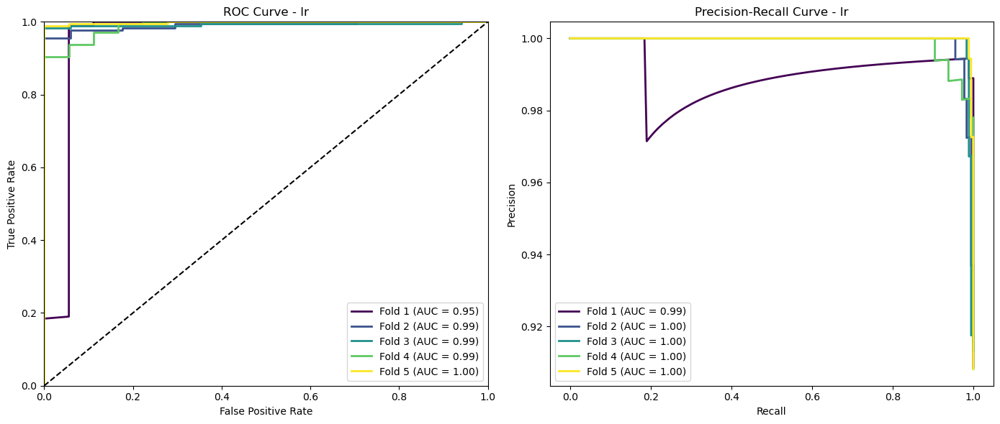

Modelo: lr - Características seleccionadas: ['hsa-mir-106a', 'hsa-mir-1180', 'hsa-mir-1248', 'hsa-mir-1266', 'hsa-mir-1271', 'hsa-mir-1301', 'hsa-mir-1306', 'hsa-mir-135b', 'hsa-mir-1468', 'hsa-mir-153-2', 'hsa-mir-190b', 'hsa-mir-1976', 'hsa-mir-203b', 'hsa-mir-212', 'hsa-mir-215', 'hsa-mir-217', 'hsa-mir-219a-1', 'hsa-mir-296', 'hsa-mir-31', 'hsa-mir-3200', 'hsa-mir-323a', 'hsa-mir-323b', 'hsa-mir-326', 'hsa-mir-335', 'hsa-mir-33b', 'hsa-mir-34c', 'hsa-mir-3605', 'hsa-mir-3614', 'hsa-mir-3615', 'hsa-mir-376c', 'hsa-mir-377', 'hsa-mir-378c', 'hsa-mir-382', 'hsa-mir-3913-1', 'hsa-mir-3928', 'hsa-mir-412', 'hsa-mir-421', 'hsa-mir-429', 'hsa-mir-432', 'hsa-mir-450b', 'hsa-mir-4661', 'hsa-mir-4772', 'hsa-mir-483', 'hsa-mir-486-2', 'hsa-mir-487b', 'hsa-mir-491', 'hsa-mir-493', 'hsa-mir-495', 'hsa-mir-496', 'hsa-mir-500b', 'hsa-mir-502', 'hsa-mir-511', 'hsa-mir-539', 'hsa-mir-550a-1', 'hsa-mir-550a-2', 'hsa-mir-5586', 'hsa-mir-590', 'hsa-mir-616', 'hsa-mir-642a', 'hsa-mir-651', 'hsa-mir-651

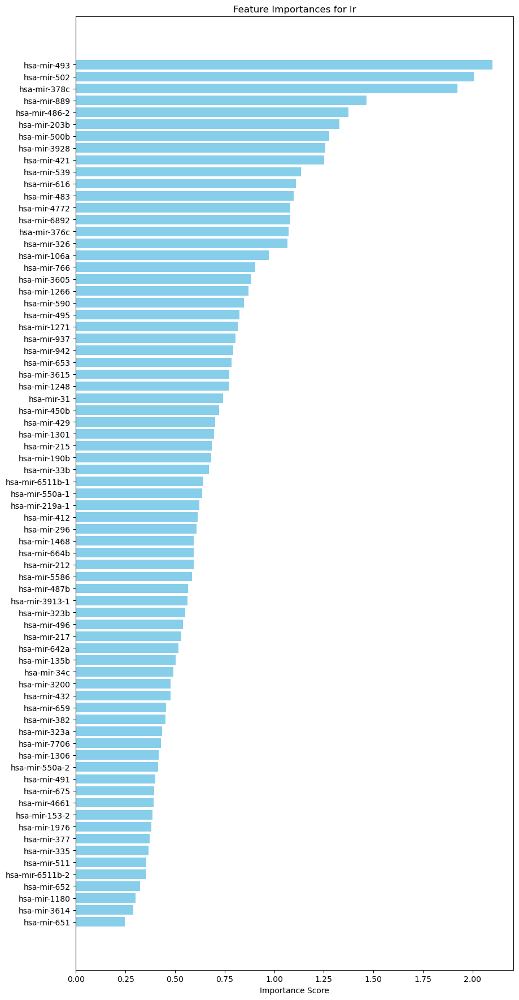

Importancia/Puntuación de características seleccionadas. Las features de bacterias no se muestran porque su importancia es nula, aunque se utilizarán para entrenar el modelo lr
          Feature  Importance
46    hsa-mir-493    2.101374
50    hsa-mir-502    2.006344
31   hsa-mir-378c    1.924732
70    hsa-mir-889    1.464675
43  hsa-mir-486-2    1.374180
12   hsa-mir-203b    1.329987
49   hsa-mir-500b    1.278676
34   hsa-mir-3928    1.257135
36    hsa-mir-421    1.252057
52    hsa-mir-539    1.135744
Características utilizadas para entrenar el modelo lr
Index(['hsa-mir-493', 'hsa-mir-502', 'hsa-mir-378c', 'hsa-mir-889',
       'hsa-mir-486-2', 'hsa-mir-203b', 'hsa-mir-500b', 'hsa-mir-3928',
       'hsa-mir-421', 'hsa-mir-539', 'Bacteroidales', 'Burkholderiales',
       'Clostridiales', 'Enterobacteriales', 'Lactobacillales',
       'Pseudomonadales', 'Rhizobiales', 'Sphingomonadales'],
      dtype='object')
Todos los nombres de características son únicos.
Gráficas ROC y precision-reca

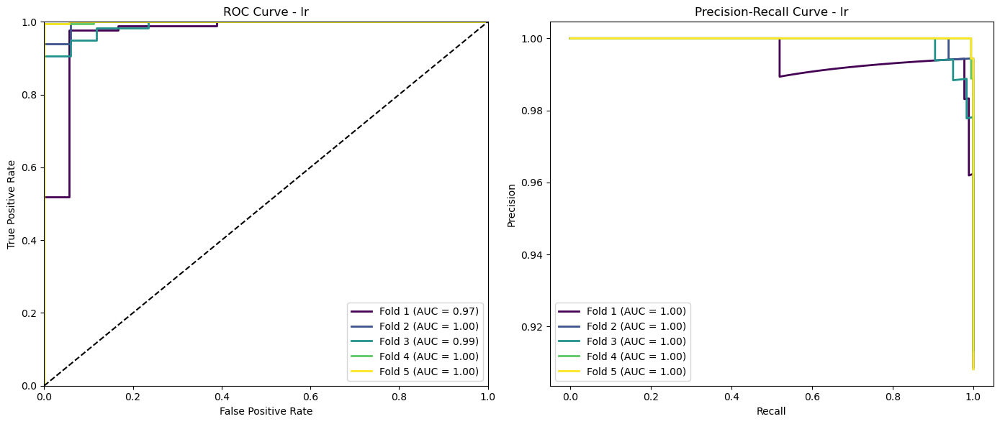


Evaluación del modelo: lr
ROC AUC: 1.00
Accuracy: 0.98
F1 Score: 0.99
Precision: 0.99
Recall: 0.99

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.88      0.90        16
           1       0.99      0.99      0.99       158

    accuracy                           0.98       174
   macro avg       0.96      0.93      0.95       174
weighted avg       0.98      0.98      0.98       174

Matriz de Confusión:


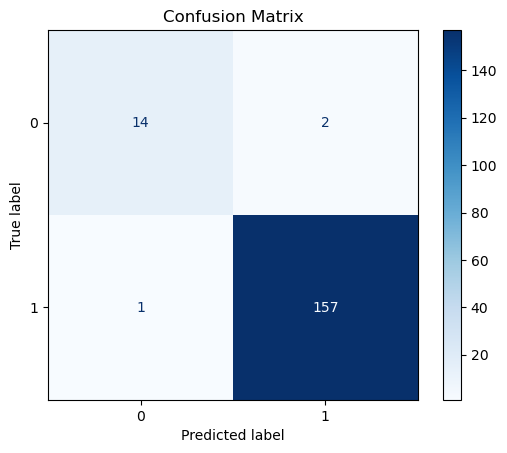

Gráficas ROC y precision-recall para el modelo lr y los datos de prueba:


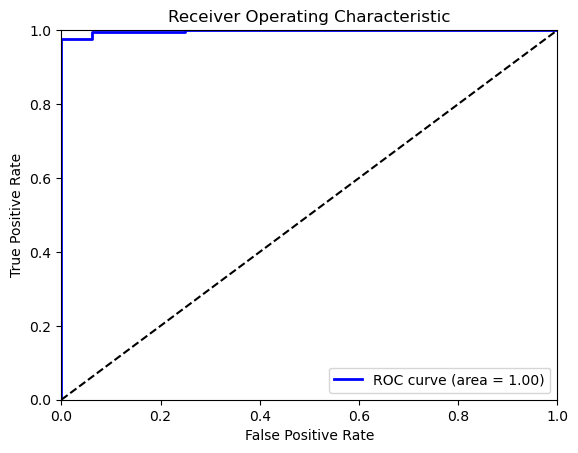

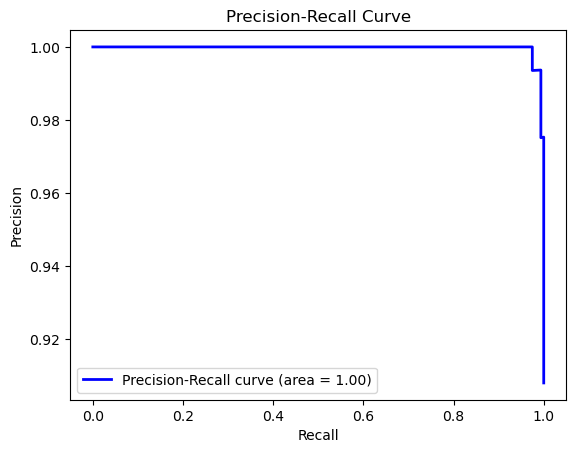

Optimizando hiperparámetros para svc
Mejores parámetros encontrados para svc:
{'classification__C': 0.1, 'classification__gamma': 'scale', 'classification__kernel': 'linear', 'classification__probability': True, 'feature_selection__estimator__C': 0.1, 'feature_selection__estimator__gamma': 'scale', 'feature_selection__estimator__kernel': 'linear'}
Mejor puntuación de validación cruzada para svc:
0.9960784049240121


Gráficas ROC y precision-recall para el modelo svc y las features antes de hacer selección de estas:


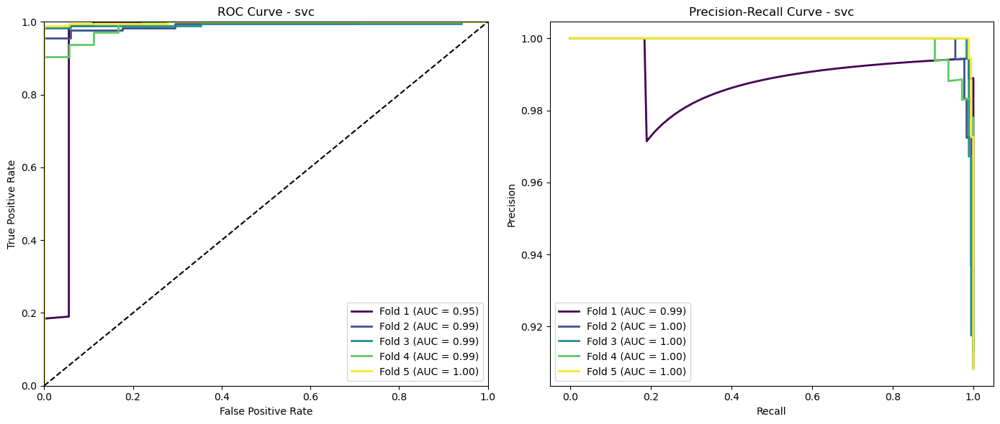

Modelo: svc - Características seleccionadas: ['hsa-mir-1271', 'hsa-mir-1296', 'hsa-mir-1301', 'hsa-mir-203b', 'hsa-mir-3200', 'hsa-mir-326', 'hsa-mir-3605', 'hsa-mir-3615', 'hsa-mir-378c', 'hsa-mir-421', 'hsa-mir-486-2', 'hsa-mir-493', 'hsa-mir-495', 'hsa-mir-500b', 'hsa-mir-502', 'hsa-mir-539', 'hsa-mir-942', 'hsa-mir-96']


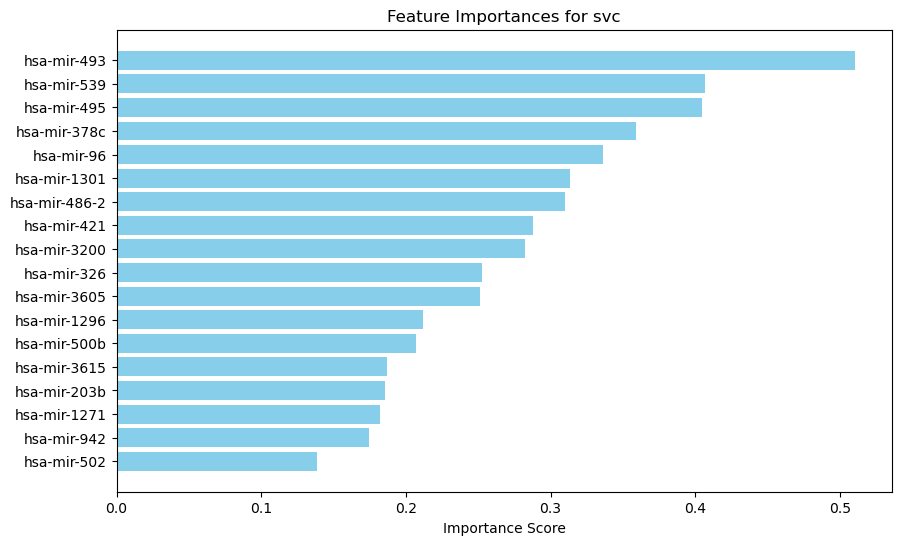

Importancia/Puntuación de características seleccionadas. Las features de bacterias no se muestran porque su importancia es nula, aunque se utilizarán para entrenar el modelo svc
          Feature  Importance
11    hsa-mir-493    0.510313
15    hsa-mir-539    0.406834
12    hsa-mir-495    0.404885
8    hsa-mir-378c    0.359341
17     hsa-mir-96    0.336382
2    hsa-mir-1301    0.313717
10  hsa-mir-486-2    0.310221
9     hsa-mir-421    0.287796
4    hsa-mir-3200    0.282123
5     hsa-mir-326    0.252372
Características utilizadas para entrenar el modelo svc
Index(['hsa-mir-493', 'hsa-mir-539', 'hsa-mir-495', 'hsa-mir-378c',
       'hsa-mir-96', 'hsa-mir-1301', 'hsa-mir-486-2', 'hsa-mir-421',
       'hsa-mir-3200', 'hsa-mir-326', 'Bacteroidales', 'Burkholderiales',
       'Clostridiales', 'Enterobacteriales', 'Lactobacillales',
       'Pseudomonadales', 'Rhizobiales', 'Sphingomonadales'],
      dtype='object')
Todos los nombres de características son únicos.
Gráficas ROC y precision-reca

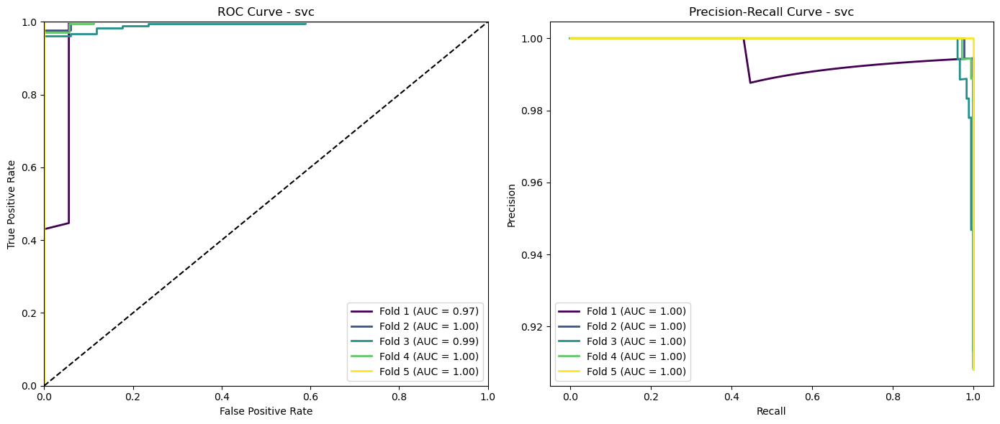


Evaluación del modelo: svc
ROC AUC: 1.00
Accuracy: 0.99
F1 Score: 1.00
Precision: 1.00
Recall: 0.99

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97        16
           1       1.00      0.99      1.00       158

    accuracy                           0.99       174
   macro avg       0.97      1.00      0.98       174
weighted avg       0.99      0.99      0.99       174

Matriz de Confusión:


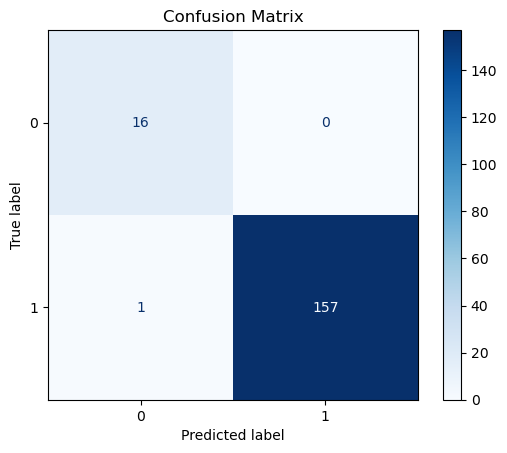

Gráficas ROC y precision-recall para el modelo svc y los datos de prueba:


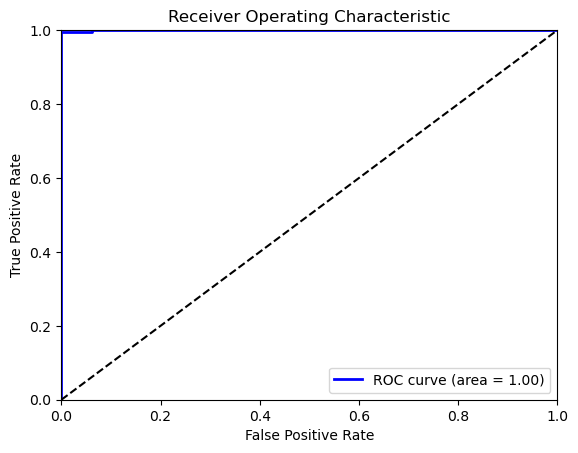

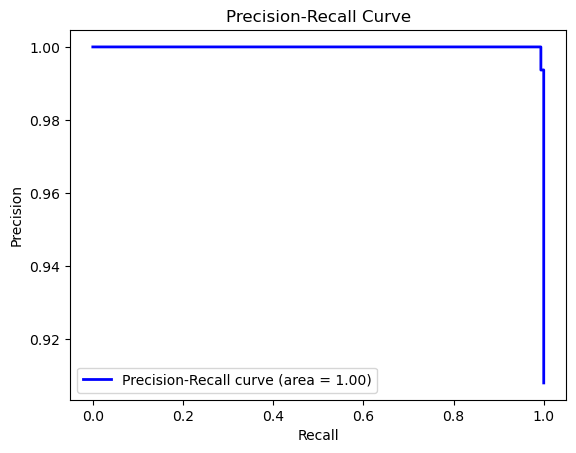

Optimizando hiperparámetros para dt
Mejores parámetros encontrados para dt:
{'classification__max_depth': None, 'classification__min_samples_leaf': 1, 'classification__min_samples_split': 2, 'feature_selection__n_features_to_select': 133}
Mejor puntuación de validación cruzada para dt:
0.9821133050931599


Gráficas ROC y precision-recall para el modelo dt y las features antes de hacer selección de estas:


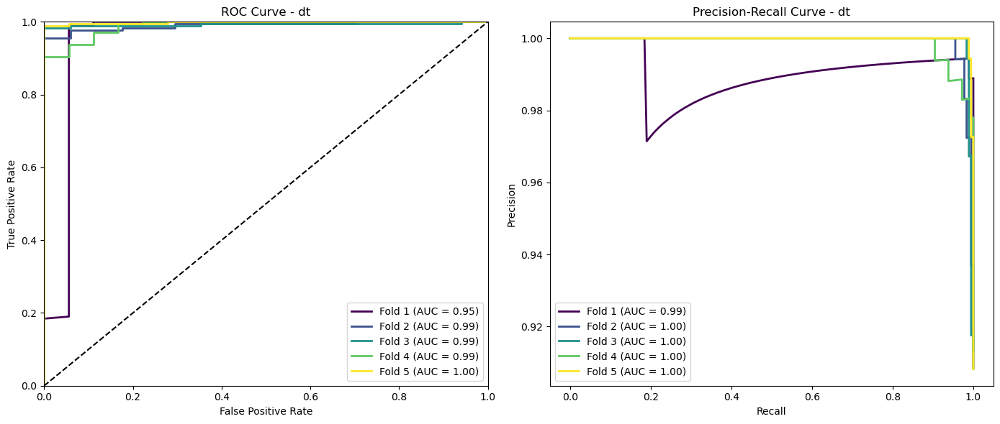

Modelo: dt - Características seleccionadas: ['hsa-mir-1-2', 'hsa-mir-106a', 'hsa-mir-1180', 'hsa-mir-1245a', 'hsa-mir-1247', 'hsa-mir-1248', 'hsa-mir-1249', 'hsa-mir-1266', 'hsa-mir-1271', 'hsa-mir-1296', 'hsa-mir-1301', 'hsa-mir-1306', 'hsa-mir-135b', 'hsa-mir-136', 'hsa-mir-1468', 'hsa-mir-151b', 'hsa-mir-153-2', 'hsa-mir-154', 'hsa-mir-184', 'hsa-mir-187', 'hsa-mir-188', 'hsa-mir-18a', 'hsa-mir-190a', 'hsa-mir-190b', 'hsa-mir-1976', 'hsa-mir-203b', 'hsa-mir-20b', 'hsa-mir-2110', 'hsa-mir-212', 'hsa-mir-215', 'hsa-mir-217', 'hsa-mir-219a-1', 'hsa-mir-224', 'hsa-mir-296', 'hsa-mir-299', 'hsa-mir-301a', 'hsa-mir-31', 'hsa-mir-3127', 'hsa-mir-3170', 'hsa-mir-3200', 'hsa-mir-320b-1', 'hsa-mir-320b-2', 'hsa-mir-323a', 'hsa-mir-323b', 'hsa-mir-326', 'hsa-mir-335', 'hsa-mir-33a', 'hsa-mir-33b', 'hsa-mir-34b', 'hsa-mir-34c', 'hsa-mir-3605', 'hsa-mir-3613', 'hsa-mir-3614', 'hsa-mir-3615', 'hsa-mir-362', 'hsa-mir-3653', 'hsa-mir-3677', 'hsa-mir-369', 'hsa-mir-376c', 'hsa-mir-377', 'hsa-mir-378

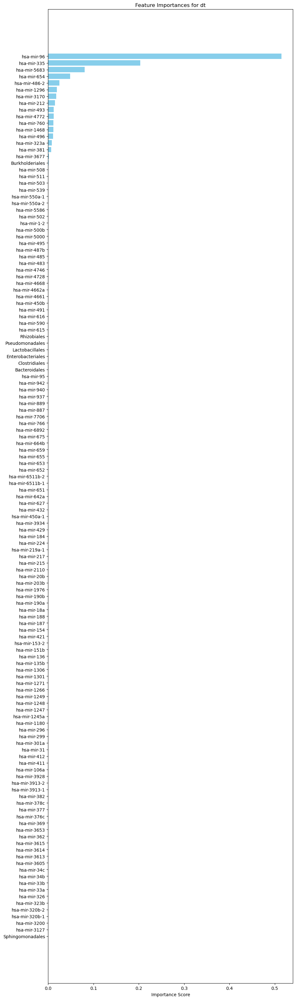

Importancia/Puntuación de características seleccionadas. Las features de bacterias no se muestran porque su importancia es nula, aunque se utilizarán para entrenar el modelo dt
           Feature  Importance
124     hsa-mir-96    0.514593
45     hsa-mir-335    0.203339
98    hsa-mir-5683    0.080459
109    hsa-mir-654    0.048781
82   hsa-mir-486-2    0.024561
9     hsa-mir-1296    0.019349
38    hsa-mir-3170    0.017834
28     hsa-mir-212    0.014980
85     hsa-mir-493    0.012315
79    hsa-mir-4772    0.011986
Características utilizadas para entrenar el modelo dt
Index(['hsa-mir-96', 'hsa-mir-335', 'hsa-mir-5683', 'hsa-mir-654',
       'hsa-mir-486-2', 'hsa-mir-1296', 'hsa-mir-3170', 'hsa-mir-212',
       'hsa-mir-493', 'hsa-mir-4772', 'Bacteroidales', 'Burkholderiales',
       'Clostridiales', 'Enterobacteriales', 'Lactobacillales',
       'Pseudomonadales', 'Rhizobiales', 'Sphingomonadales'],
      dtype='object')
Todos los nombres de características son únicos.
Gráficas ROC y prec

/opt/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_rfe.py:291: UserWarning: Found n_features_to_select=133 > n_features=18. There will be no feature selection and all features will be kept.
  warnings.warn(


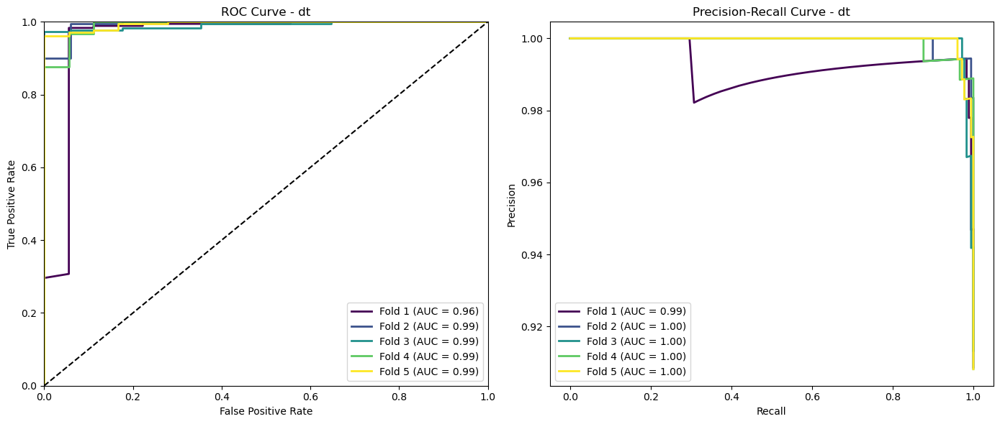


Evaluación del modelo: dt
ROC AUC: 0.84
Accuracy: 0.96
F1 Score: 0.98
Precision: 0.97
Recall: 0.99

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.69      0.76        16
           1       0.97      0.99      0.98       158

    accuracy                           0.96       174
   macro avg       0.91      0.84      0.87       174
weighted avg       0.96      0.96      0.96       174

Matriz de Confusión:


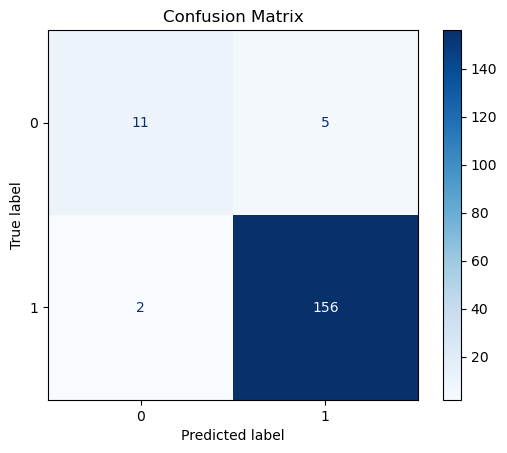

Gráficas ROC y precision-recall para el modelo dt y los datos de prueba:


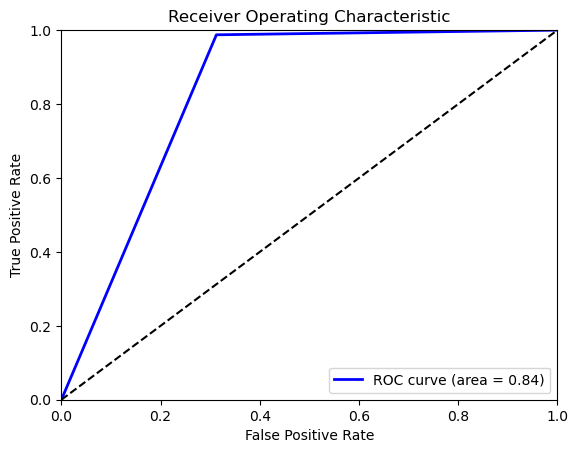

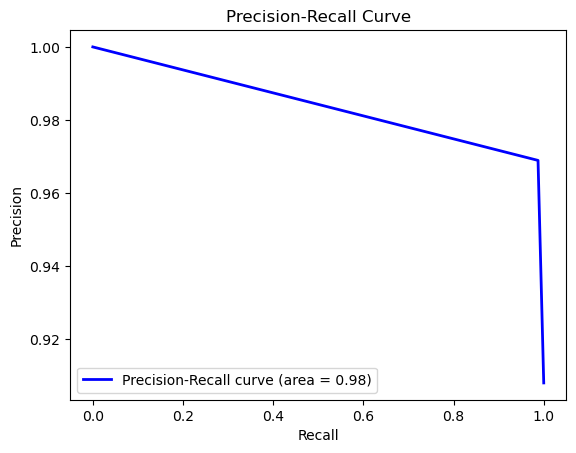

Optimizando hiperparámetros para rf
Mejores parámetros encontrados para rf:
{'classification__max_depth': 20, 'classification__max_features': 18, 'classification__n_estimators': 20, 'feature_selection__n_features_to_select': 133}
Mejor puntuación de validación cruzada para rf:
0.9927853354159138


Gráficas ROC y precision-recall para el modelo rf y las features antes de hacer selección de estas:


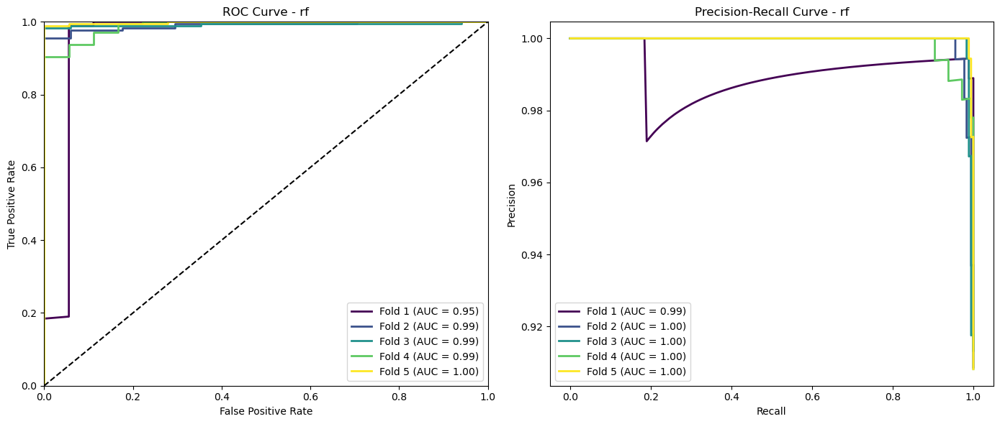

Modelo: rf - Características seleccionadas: ['hsa-mir-1-2', 'hsa-mir-106a', 'hsa-mir-1180', 'hsa-mir-1245a', 'hsa-mir-1247', 'hsa-mir-1248', 'hsa-mir-1249', 'hsa-mir-1266', 'hsa-mir-1271', 'hsa-mir-1296', 'hsa-mir-1301', 'hsa-mir-1306', 'hsa-mir-135b', 'hsa-mir-136', 'hsa-mir-1468', 'hsa-mir-151b', 'hsa-mir-153-2', 'hsa-mir-154', 'hsa-mir-184', 'hsa-mir-187', 'hsa-mir-188', 'hsa-mir-18a', 'hsa-mir-190a', 'hsa-mir-190b', 'hsa-mir-1976', 'hsa-mir-203b', 'hsa-mir-20b', 'hsa-mir-2110', 'hsa-mir-212', 'hsa-mir-215', 'hsa-mir-217', 'hsa-mir-219a-1', 'hsa-mir-224', 'hsa-mir-296', 'hsa-mir-299', 'hsa-mir-301a', 'hsa-mir-31', 'hsa-mir-3127', 'hsa-mir-3170', 'hsa-mir-3200', 'hsa-mir-320b-1', 'hsa-mir-320b-2', 'hsa-mir-323a', 'hsa-mir-323b', 'hsa-mir-326', 'hsa-mir-335', 'hsa-mir-33a', 'hsa-mir-33b', 'hsa-mir-34b', 'hsa-mir-34c', 'hsa-mir-3605', 'hsa-mir-3613', 'hsa-mir-3614', 'hsa-mir-3615', 'hsa-mir-362', 'hsa-mir-3653', 'hsa-mir-3677', 'hsa-mir-369', 'hsa-mir-376c', 'hsa-mir-377', 'hsa-mir-378

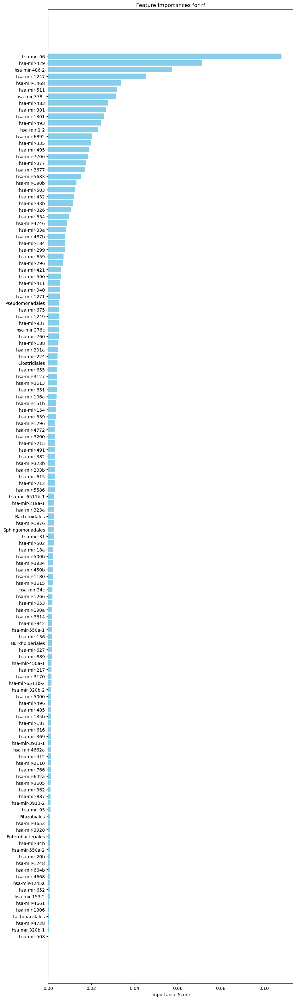

Importancia/Puntuación de características seleccionadas. Las features de bacterias no se muestran porque su importancia es nula, aunque se utilizarán para entrenar el modelo rf
           Feature  Importance
124     hsa-mir-96    0.108105
70     hsa-mir-429    0.071357
82   hsa-mir-486-2    0.057457
4     hsa-mir-1247    0.045125
14    hsa-mir-1468    0.033723
93     hsa-mir-511    0.031798
60    hsa-mir-378c    0.031388
80     hsa-mir-483    0.027872
61     hsa-mir-381    0.026732
10    hsa-mir-1301    0.025795
Características utilizadas para entrenar el modelo rf
Index(['hsa-mir-96', 'hsa-mir-429', 'hsa-mir-486-2', 'hsa-mir-1247',
       'hsa-mir-1468', 'hsa-mir-511', 'hsa-mir-378c', 'hsa-mir-483',
       'hsa-mir-381', 'hsa-mir-1301', 'Bacteroidales', 'Burkholderiales',
       'Clostridiales', 'Enterobacteriales', 'Lactobacillales',
       'Pseudomonadales', 'Rhizobiales', 'Sphingomonadales'],
      dtype='object')
Todos los nombres de características son únicos.
Gráficas ROC y prec

/opt/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_rfe.py:291: UserWarning: Found n_features_to_select=133 > n_features=18. There will be no feature selection and all features will be kept.
  warnings.warn(


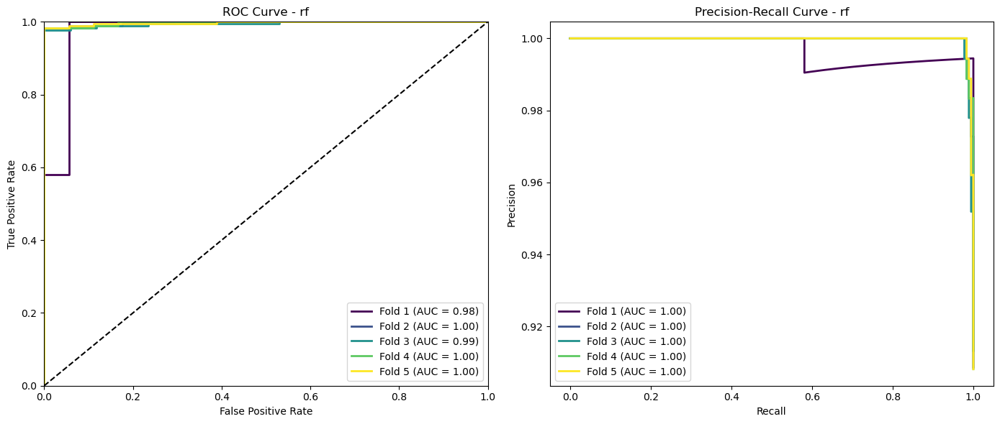


Evaluación del modelo: rf
ROC AUC: 0.96
Accuracy: 0.98
F1 Score: 0.99
Precision: 0.99
Recall: 0.98

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.94      0.88        16
           1       0.99      0.98      0.99       158

    accuracy                           0.98       174
   macro avg       0.91      0.96      0.93       174
weighted avg       0.98      0.98      0.98       174

Matriz de Confusión:


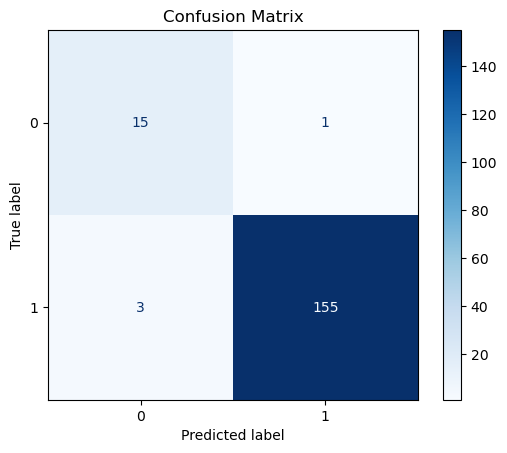

Gráficas ROC y precision-recall para el modelo rf y los datos de prueba:


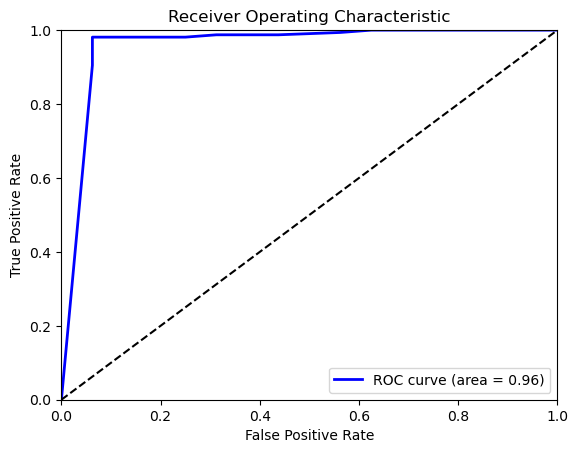

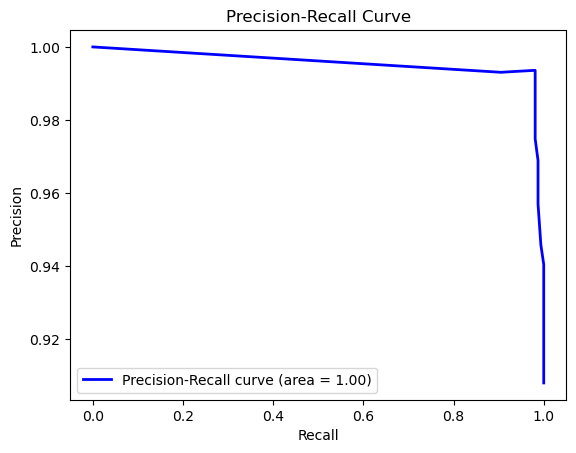

Optimizando hiperparámetros para mlp


/opt/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (25) reached and the optimization hasn't converged yet.
  warnings.warn(


Mejores parámetros encontrados para mlp:
{'classification__activation': 'tanh', 'classification__alpha': 0.01, 'classification__early_stopping': True, 'classification__hidden_layer_sizes': (50, 50, 50), 'classification__learning_rate': 'adaptive', 'classification__max_iter': 25, 'classification__solver': 'adam', 'feature_selection__n_features_to_select': 133}
Mejor puntuación de validación cruzada para mlp:
0.9915522913278612


Gráficas ROC y precision-recall para el modelo mlp y las features antes de hacer selección de estas:


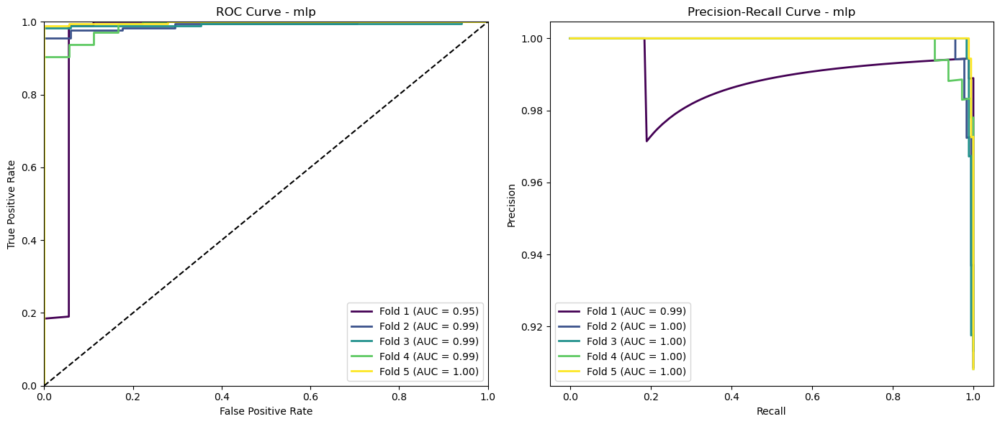

Modelo: mlp - Características seleccionadas: ['hsa-mir-1-2', 'hsa-mir-106a', 'hsa-mir-1180', 'hsa-mir-1245a', 'hsa-mir-1247', 'hsa-mir-1248', 'hsa-mir-1249', 'hsa-mir-1266', 'hsa-mir-1271', 'hsa-mir-1296', 'hsa-mir-1301', 'hsa-mir-1306', 'hsa-mir-135b', 'hsa-mir-136', 'hsa-mir-1468', 'hsa-mir-151b', 'hsa-mir-153-2', 'hsa-mir-154', 'hsa-mir-184', 'hsa-mir-187', 'hsa-mir-188', 'hsa-mir-18a', 'hsa-mir-190a', 'hsa-mir-190b', 'hsa-mir-1976', 'hsa-mir-203b', 'hsa-mir-20b', 'hsa-mir-2110', 'hsa-mir-212', 'hsa-mir-215', 'hsa-mir-217', 'hsa-mir-219a-1', 'hsa-mir-224', 'hsa-mir-296', 'hsa-mir-299', 'hsa-mir-301a', 'hsa-mir-31', 'hsa-mir-3127', 'hsa-mir-3170', 'hsa-mir-3200', 'hsa-mir-320b-1', 'hsa-mir-320b-2', 'hsa-mir-323a', 'hsa-mir-323b', 'hsa-mir-326', 'hsa-mir-335', 'hsa-mir-33a', 'hsa-mir-33b', 'hsa-mir-34b', 'hsa-mir-34c', 'hsa-mir-3605', 'hsa-mir-3613', 'hsa-mir-3614', 'hsa-mir-3615', 'hsa-mir-362', 'hsa-mir-3653', 'hsa-mir-3677', 'hsa-mir-369', 'hsa-mir-376c', 'hsa-mir-377', 'hsa-mir-37

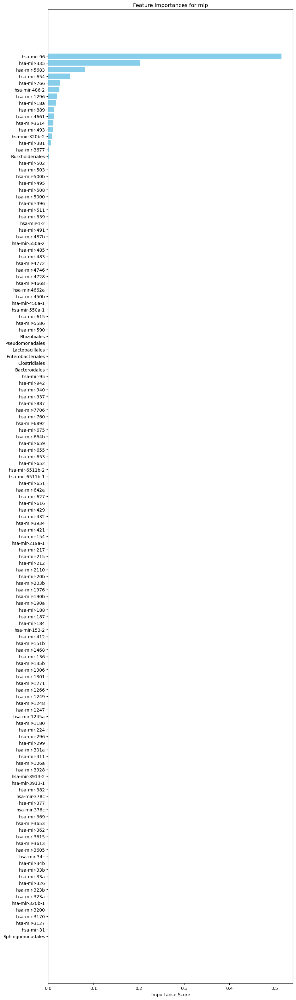

Importancia/Puntuación de características seleccionadas. Las features de bacterias no se muestran porque su importancia es nula, aunque se utilizarán para entrenar el modelo mlp
           Feature  Importance
124     hsa-mir-96    0.514593
45     hsa-mir-335    0.203339
98    hsa-mir-5683    0.080459
109    hsa-mir-654    0.048781
116    hsa-mir-766    0.026651
82   hsa-mir-486-2    0.024561
9     hsa-mir-1296    0.019349
21     hsa-mir-18a    0.017834
119    hsa-mir-889    0.012315
74    hsa-mir-4661    0.011986
Características utilizadas para entrenar el modelo mlp
Index(['hsa-mir-96', 'hsa-mir-335', 'hsa-mir-5683', 'hsa-mir-654',
       'hsa-mir-766', 'hsa-mir-486-2', 'hsa-mir-1296', 'hsa-mir-18a',
       'hsa-mir-889', 'hsa-mir-4661', 'Bacteroidales', 'Burkholderiales',
       'Clostridiales', 'Enterobacteriales', 'Lactobacillales',
       'Pseudomonadales', 'Rhizobiales', 'Sphingomonadales'],
      dtype='object')
Todos los nombres de características son únicos.
Gráficas ROC y pre

/opt/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_rfe.py:291: UserWarning: Found n_features_to_select=133 > n_features=18. There will be no feature selection and all features will be kept.
  warnings.warn(


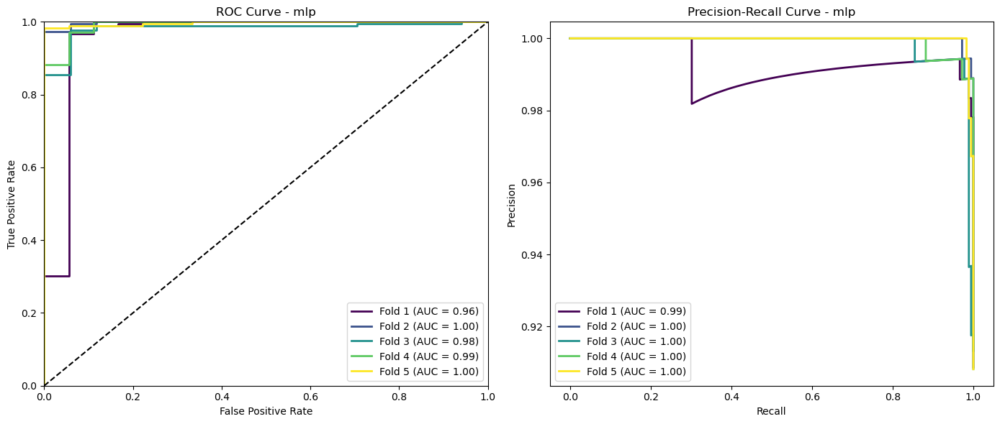


Evaluación del modelo: mlp
ROC AUC: 1.00
Accuracy: 0.99
F1 Score: 0.99
Precision: 0.99
Recall: 1.00

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.88      0.93        16
           1       0.99      1.00      0.99       158

    accuracy                           0.99       174
   macro avg       0.99      0.94      0.96       174
weighted avg       0.99      0.99      0.99       174

Matriz de Confusión:


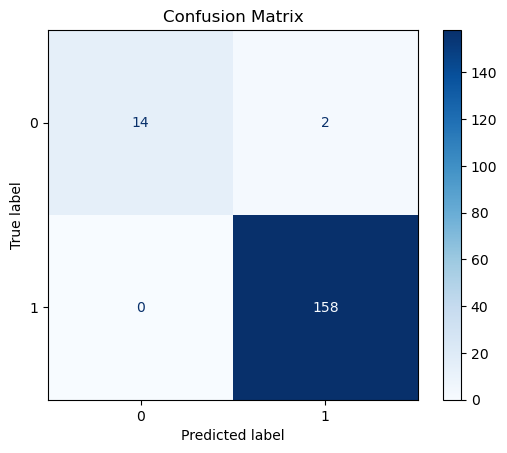

Gráficas ROC y precision-recall para el modelo mlp y los datos de prueba:


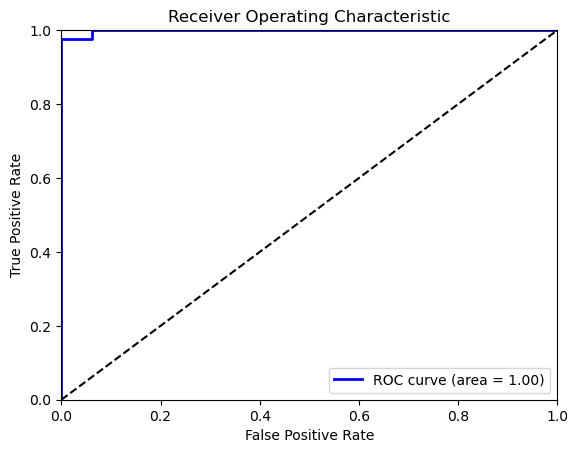

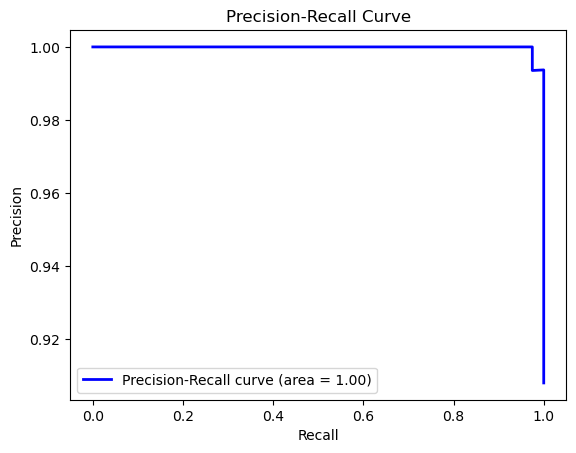

Optimizando hiperparámetros para knn
Mejores parámetros encontrados para knn:
{'classification__algorithm': 'auto', 'classification__leaf_size': 20, 'classification__n_neighbors': 11, 'classification__p': 2, 'classification__weights': 'uniform', 'feature_selection__n_features_to_select': 133}
Mejor puntuación de validación cruzada para knn:
0.9960846471229097


Gráficas ROC y precision-recall para el modelo knn y las features antes de hacer selección de estas:


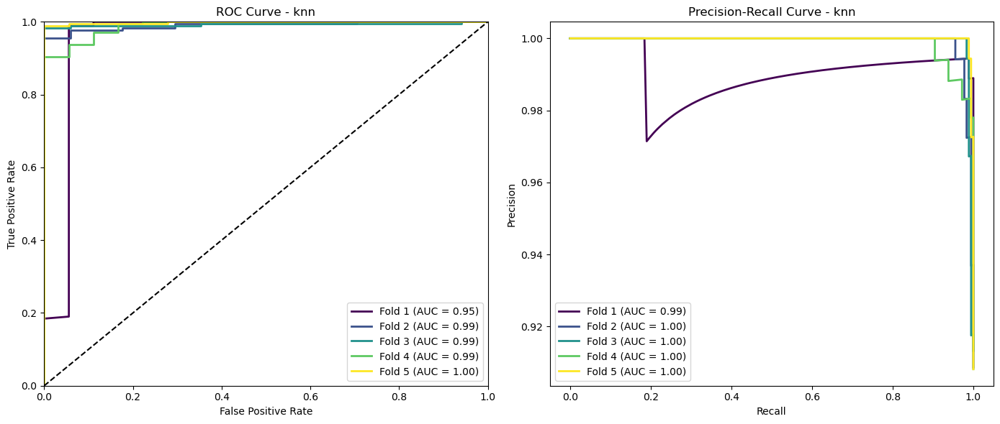

Modelo: knn - Características seleccionadas: ['hsa-mir-1-2', 'hsa-mir-106a', 'hsa-mir-1180', 'hsa-mir-1245a', 'hsa-mir-1247', 'hsa-mir-1248', 'hsa-mir-1249', 'hsa-mir-1266', 'hsa-mir-1271', 'hsa-mir-1296', 'hsa-mir-1301', 'hsa-mir-1306', 'hsa-mir-135b', 'hsa-mir-136', 'hsa-mir-1468', 'hsa-mir-151b', 'hsa-mir-153-2', 'hsa-mir-154', 'hsa-mir-184', 'hsa-mir-187', 'hsa-mir-188', 'hsa-mir-18a', 'hsa-mir-190a', 'hsa-mir-190b', 'hsa-mir-1976', 'hsa-mir-203b', 'hsa-mir-20b', 'hsa-mir-2110', 'hsa-mir-212', 'hsa-mir-215', 'hsa-mir-217', 'hsa-mir-219a-1', 'hsa-mir-224', 'hsa-mir-296', 'hsa-mir-299', 'hsa-mir-301a', 'hsa-mir-31', 'hsa-mir-3127', 'hsa-mir-3170', 'hsa-mir-3200', 'hsa-mir-320b-1', 'hsa-mir-320b-2', 'hsa-mir-323a', 'hsa-mir-323b', 'hsa-mir-326', 'hsa-mir-335', 'hsa-mir-33a', 'hsa-mir-33b', 'hsa-mir-34b', 'hsa-mir-34c', 'hsa-mir-3605', 'hsa-mir-3613', 'hsa-mir-3614', 'hsa-mir-3615', 'hsa-mir-362', 'hsa-mir-3653', 'hsa-mir-3677', 'hsa-mir-369', 'hsa-mir-376c', 'hsa-mir-377', 'hsa-mir-37

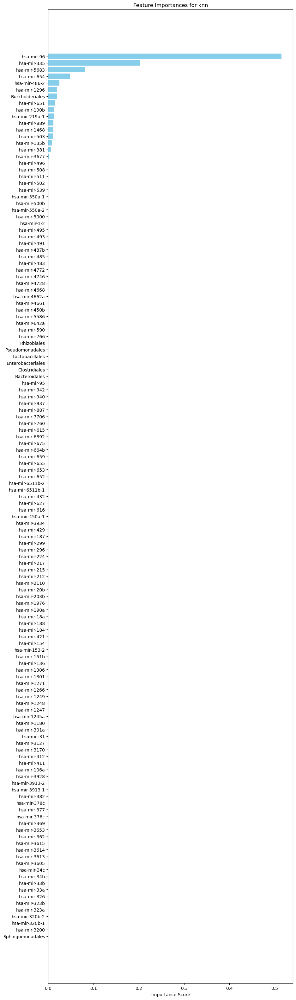

Importancia/Puntuación de características seleccionadas. Las features de bacterias no se muestran porque su importancia es nula, aunque se utilizarán para entrenar el modelo knn
             Feature  Importance
124       hsa-mir-96    0.514593
45       hsa-mir-335    0.203339
98      hsa-mir-5683    0.080459
109      hsa-mir-654    0.048781
82     hsa-mir-486-2    0.024561
9       hsa-mir-1296    0.019349
126  Burkholderiales    0.018859
104      hsa-mir-651    0.014980
23      hsa-mir-190b    0.012315
31    hsa-mir-219a-1    0.011986
Características utilizadas para entrenar el modelo knn
Index(['hsa-mir-96', 'hsa-mir-335', 'hsa-mir-5683', 'hsa-mir-654',
       'hsa-mir-486-2', 'hsa-mir-1296', 'Burkholderiales', 'hsa-mir-651',
       'hsa-mir-190b', 'hsa-mir-219a-1', 'Bacteroidales', 'Burkholderiales',
       'Clostridiales', 'Enterobacteriales', 'Lactobacillales',
       'Pseudomonadales', 'Rhizobiales', 'Sphingomonadales'],
      dtype='object')
Hay nombres de características duplica

/opt/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_rfe.py:291: UserWarning: Found n_features_to_select=133 > n_features=18. There will be no feature selection and all features will be kept.
  warnings.warn(


ValueError: feature_names must be unique

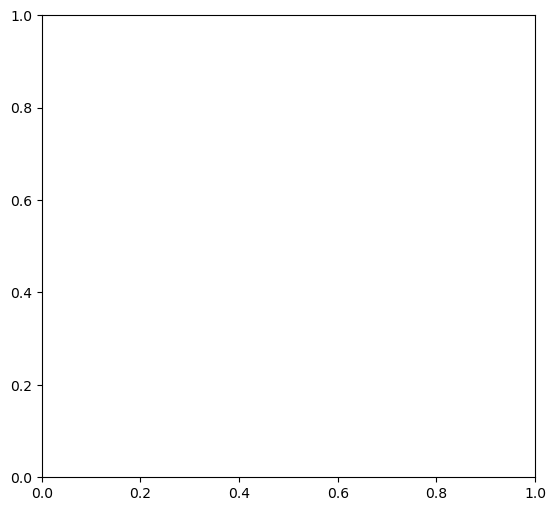

In [178]:
results = {}
feature_importances = {}
bacteria_features = ['Bacteroidales', 'Burkholderiales', 'Clostridiales', 'Enterobacteriales', 'Lactobacillales', 'Pseudomonadales', 'Rhizobiales', 'Sphingomonadales']

for model_name, (pipeline, param_grid) in models_2.items():
    print(f"Optimizando hiperparámetros para {model_name}")
    cv_folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 42)
    # Se busca el mejor modelo con la mejor combinación de hiperparámetros
    grid_search = GridSearchCV(estimator = pipeline, param_grid = param_grid, cv = cv_folds, scoring = 'f1', n_jobs = -1)
    # Se usa el dataset NO oversampleado para comprobar overfitting
    grid_search.fit(X_train_model_1, y_train_model_1)
    #grid_search.fit(X_train_resampled, y_train_resampled)
    # Se almacena el mejor modelo encontrado en la búsqueda
    best_model = grid_search.best_estimator_
    # Se guardan los resultados
    results[model_name] = {
        'best_params': grid_search.best_params_,
        'best_score': grid_search.best_score_,
        'best_model': best_model
    }
    # Se guardan en variables los mejores parámetros y la clase del modelo para usarlas en la función de las gráficas
    best_params = grid_search.best_params_
    #model_class = best_model.named_steps['classification'].__class__

    # Separar los parámetros
    #classification_params = {k.split('__', 1)[-1]: v for k, v in best_params.items() if k.startswith('classification__')}
    #print("Parámetros de selección de características:", feature_selection_params)
    #print("Parámetros de clasificación:", classification_params)

    # Crear una instancia del clasificador vacío con los parámetros del mejor modelo
    #classification = model_class(**classification_params)
    #classification = best_model.named_steps['classification'].__class__(**classification_params)

    # Ajustar el clasificador con los parámetros del mejor modelo
    #classification.set_params(**classification_params)
    
    # Se muestran por pantalla
    print(f"Mejores parámetros encontrados para {model_name}:")
    print(grid_search.best_params_)
    print(f"Mejor puntuación de validación cruzada para {model_name}:")
    print(grid_search.best_score_)
    print("\n")
    
    # Se grafican las curvas ROC y Precision-Recall para cada pliegue con el fin de observar el rendimiento durante el entrenamiento
    # y todas las características
    print(f"Gráficas ROC y precision-recall para el modelo {model_name} y las features antes de hacer selección de estas:")
    plot_roc_pr_curves(classification, X_train_model_1, y_train_model_1, cv_folds, model_name)
    #plot_roc_pr_curves(classification, X_train_resampled, y_train_resampled, cv_folds, model_name)

    # Selección de características:
    # Se accede al paso de selección de características del pipeline
    #selector = best_model.named_steps['feature_selection']
    
    #if (model_name == 'svc' or model_name == 'mlp' or model_name == 'knn' or model_name == 'nb'):
        # Se calcula la importancia de las características utilizando permutación
    #    result = permutation_importance(best_model, X_test_model_1, y_test_model_1, n_repeats = 10, random_state = 42)
        # Se extraen las importancias de las características
    #    importances = result.importances_mean
        # Las características seleccionadas son
    #    selected_features = X_test_model_1.columns
        # Se asigna valor null a selector para futuras condiciones
    #    selector = None
    # Se obtiene el soporte de las características seleccionadas por el selector
    if hasattr(best_model.named_steps['feature_selection'], 'get_support'):
        selector = best_model.named_steps['feature_selection']
        # Array booleano de las características que se han seleccionado como importantes
        selected_features_mask = selector.get_support()
        #print(f"selected_features_mask: {selected_features_mask} and len: {len(selected_features_mask)}")
        # Características seleccionadas
        selected_features = X_train_model_1.columns[selected_features_mask]
        #selected_features = X_train_resampled.columns[selected_features_mask]
    elif hasattr(best_model.named_steps['feature_selection'], 'support_'):
        selector = best_model.named_steps['feature_selection']
        selected_features_mask = selector.support_
        #print(f"selected_features_mask: {selected_features_mask} and len: {len(selected_features_mask)}")
        selected_features = X_train_model_1.columns[selected_features_mask]
        #selected_features = X_train_resampled.columns[selected_features_mask]
    else:
        raise AttributeError(f"El selector de características no tiene el método 'get_support' ni 'support_': {selector}")
        #selected_features = X_train_resampled.columns[selector.get_support()]

    print(f"Modelo: {model_name} - Características seleccionadas: {selected_features.tolist()}")

    # Se crea un dataframe para almacenar las características seleccionadas y su "importancia" o puntuación
    # Se debe comprobar qué atributos tiene en función del selector de características, dado que cada modelo definido utiliza un selector específico

    # Se verifica que el selector sea de tipo RFE
    #if isinstance(selector, (RFE, SelectFromModel)):
        # Se accede el modelo subyacente de RFE
    estimator = selector.estimator_
    if hasattr(estimator, 'feature_importances_'):
        # Para modelos de árboles de decisión u otros que usan `feature_importances_`
        all_importances = estimator.feature_importances_
        #print(f"all_importances: {all_importances} and len: {len(all_importances)}")
        importances = all_importances[selected_features_mask]
        #print(f"importances: {importances} and len: {len(importances)}")
        feature_importances_df = pd.DataFrame({'Feature': selected_features, 'Importance': importances})
    elif hasattr(estimator, 'coef_'):            
        # Para modelos lineales como Logistic Regression
        # Se obtienen los coeficientes para las características seleccionadas
        importances = np.abs(estimator.coef_).flatten()
        # Se crea un dataframe con las características seleccionadas y su "importancia" basada en los coeficientes
        feature_importances_df = pd.DataFrame({'Feature': selected_features, 'Importance': importances})
    #else:
    #    print(f"Advertencia: El modelo {type(estimator).__name__} no tiene atributos 'feature_importances_' o 'coef_'.")
    #    feature_importances_df = pd.DataFrame({'Feature': selected_features, 'Importance': [0] * len(selected_features)})
    elif hasattr(estimator, 'scores_'):
        # Para `SelectKBest` u otros métodos que proporcionan `scores_`
        feature_scores = estimator.scores_
        feature_scores = feature_scores[selected_features_mask]
        feature_importances_df = pd.DataFrame({'Feature': selected_features, 'Importance': feature_scores})
    #elif (model_name == 'svc' or model_name == 'mlp' or model_name == 'knn' or model_name == 'nb'):
    #    feature_importances_df = pd.DataFrame({'Feature': selected_features, 'Importance': importances})
    else:
        #print(f"Advertencia: No se encontraron importancias o puntuaciones para el selector: {selector}")
        #feature_importances_df = pd.DataFrame({'Feature': selected_features, 'Importance': [0] * len(selected_features)})
        print(f"Advertencia: El modelo {type(estimator).__name__} no tiene atributos 'feature_importances_', 'coef_' ni 'scores_'.")
        feature_importances_df = pd.DataFrame({'Feature': selected_features, 'Importance': [0] * len(selected_features)})

    # Se ordenan las características por importancia descendente
    feature_importances_df = feature_importances_df.sort_values(by = 'Importance', ascending = False)

    # Se grafican las características más importantes
    plot_feature_importances(feature_importances_df, model_name)

    # Se muestran las 10 características más importantes
    print(f"Importancia/Puntuación de características seleccionadas. Las features de bacterias no se muestran porque su importancia es nula, aunque se utilizarán para entrenar el modelo {model_name}")
    print(feature_importances_df.head(10))

    # Se almacenan las características más importantes para cada modelo
    feature_importances[model_name] = feature_importances_df

    # Se seleccionan las 10 características más importantes, asumiendo que todas van a ser microARN por los gráficos anteriores
    top_10_microarn_features = feature_importances_df.head(10)['Feature'].tolist()

    # Se combinan las 10 características más importantes seleccionadas con las familias bacterianas
    new_selected_features = top_10_microarn_features + bacteria_features

    # Se crea un nuevo dataset solo con las características pertinentes
    X_train_model_1_selected = X_train_model_1[new_selected_features]
    #X_train_model_1_resampled_selected = X_train_resampled[new_selected_features]
    X_test_model_1_selected = X_test_model_1[new_selected_features]

    # Se muestran las características con las que se va a reentrenar el modelo
    print(f"Características utilizadas para entrenar el modelo {model_name}")
    print(X_train_model_1_selected.columns)
    #print(X_train_model_1_resampled_selected.columns)

    # Debido a que solo se van a utilizar 18 características para re-entrenar el modelo, se fuerza a que el parámetro max_features utilizado
    # en algunos modelos como árboles, sea 18
    #if (model_name == 'Bagging'):
        #best_model.set_params(max_features = 18)
        #selector.set_params(max_features = 18)
    #    estimator.set_params(max_features = 18)

    # Se entrena el modelo con la selección de hiperparámetros más óptima y con las mejores 10 (microARN) + 8 (bacterias) características seleccionadas
    best_model.fit(X_train_model_1_selected, y_train_model_1)
    # Verifica la unicidad de los nombres de las características
    feature_names = X_train_model_1_selected.columns
    if len(feature_names) != len(set(feature_names)):
        print("Hay nombres de características duplicados.")
    else:
        print("Todos los nombres de características son únicos.")
    #best_model.fit(X_train_model_1_resampled_selected, y_train_resampled)
    # Se visualizan las curvas ROC y Precision-Recall para cada pliegue con el fin de observar el rendimiento durante el entrenamiento
    # y solo las características más importantes
    print(f"Gráficas ROC y precision-recall para el modelo {model_name} y las features después de seleccionar las más importantes:")
    #plot_roc_pr_curves(best_model, X_train_model_1_resampled_selected, y_train_resampled, cv_folds, model_name)
    #plot_roc_pr_curves(classification, X_train_model_1_resampled_selected, y_train_resampled, cv_folds, model_name)
    plot_roc_pr_curves(classification, X_train_model_1_selected, y_train_model_1, cv_folds, model_name)

    # Se evalúa el modelo y se visualizan las curvas ROC y precision-recall para los datos de test
    evaluate_model_and_plot_roc_pc_test(best_model, X_test_model_1_selected, y_test_model_1)


# Se selecciona el mejor modelo basado en la métrica seleccionada (f1)
best_model_name = max(results, key = lambda name: results[name]['best_score'])
best_model = results[best_model_name]['best_model']

print(f"Mejor modelo según la métrica F1: {best_model_name}")
print(f"Mejores parámetros: {results[best_model_name]['best_params']}")
print(f"Mejor puntuación F1 en validación cruzada: {results[best_model_name]['best_score']}")
print(f"Listado de modelos con sus características seleccionadas y su importancia/puntuación: {feature_importances}")

In [ ]:
# Realizar lo mismo, pero usando un dataset sin oversamplear, es decir, con los datos antes de hacer el SMOTE
# datos a usar: X_train_model_1, X_test_model_1, y_train_model_1, y_test_model_1
print(X_train_model_1.shape)
print(y_train_model_1.shape)